# Weather Forecasting With Deep Learning

### Team name: Bug Squashers
### Authors: Anagha Mayasandra Vinaya Simha and Naveen Asokan

## Abstract

This report investigates the development of a deep learning model for hourly weather forecasting by leveraging a combination of Long Short-Term Memory (LSTM) networks and 1D Convolutional Neural Networks (CNNs). Accurate hourly forecasts are crucial for various applications, including agriculture, transportation, and emergency management, where timely information can significantly impact decision-making processes.  Our approach begins with comprehensive preprocessing and visualizing our dataset, using a range of plots such as violin plots, bar charts, pie charts, box plots, histograms, radar plots, and pair plots to better understand the data distributions and relationships. The dataset will also be cleaned and outliers removed using Domain analysis, IQR, Mahalanobis distance and the Minimum Covariance Determinant (MCD) method. In the following sections, we discuss the machine learning approaches, or "morphisms," that will be applied and the models that we plan to deploy, including the 1D CNN, LSTM, and a hybrid model, as part of our next steps.

## 1. -Executive Summary-

### Decisions to be impacted :
In the context of weather forecasting, machine learning plays a very important role in helping us predict future weather conditions and also the accuracy of our predictions. These predictions play a crucial role in many real-world applications. Some of them include:

Agriculture:
* Crop planting: Decisions on when to plant a crop is highly dependent on the weather. If the region is expecting famine during crop planting, then the farmer might undergo huge losses.
* Irrigation: Farmers can decide on how much water would be needed based on future weather data.
* Pest Control: Many pests thrive on warmer climates where there is high CO2 levels in the soil. Controlling when to use pesticides and how much pesticides should be used is critical to crop survival.

Transportation:
* Flight and Shipping schedules: it is important for flight and shipping companies to know the weather conditions so that they can reroute in case of bad weather conditions.
* Public transport Operations: In case of severe weather, the public might need more access to public transport and knowing weather conditions beforehand can help them be prepared.

Emergency and Disaster Management:
* Resource allocation: The government can provide the necessary resources to the public when they have managed procuring large quantities of food, water etc.,
* Evacuations: The government and the public can know about the evacuation plans and can better prepare their home and shelter to bear the brunt of the disaster.

### Business values:
The aim of this project is to help the society to be better prepared in terms of future weather. As seen in the past, hurricanes and snowfall can cause a lot of property damage and have a wrongful impact on the everyday activities of a human being. This project aims to minimize these situations and improve the current weather forecasting applications.

### Data Assets:
While we did consider utilising the NOAA data as our original dataset, the hurricane Helene caused major outages due to which we had to change our data to Open Meteo historical data API. Our dataset now containes 32 features and 1086120 samples.

Predictive analytics: the data from open Meteo contains past data(from the year 2000 to Oct 11 2024) which forms the core of our features which are required for modelling. An irrigation scheduling machine can predict rain in the next few days, asking a farmer to use lesser water than usual.

Descriptive Analytics: Since we have used past data, we can easily catch the trends and seasonality in our models. For example, the transportation department can assess the past weather data patterns to determine when bad weather conditions can be expected, so that rerouting could be done in advance.

Prescriptive Analytics: The government can use prescriptive analytics to determine how many bags of grains will be required during a disaster by analyzing previous trends.


In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore")




In [3]:
from google.colab import auth
auth.authenticate_user()

In [4]:
from google.cloud import storage

# Initialize the Google Cloud clients
client = storage.Client()

# Specify your bucket and blob (file) path
bucket_name = 'weather_data_bug_squashers'
blob_name = 'weather_data_5_states.csv'

# Get the bucket and the blob
bucket = client.get_bucket(bucket_name)
blob = bucket.blob(blob_name)

# Download the file to the local runtime
blob.download_to_filename('weather_data_5_states.csv')

In [39]:
df=pd.read_csv("weather_data_5_states.csv",skiprows=7)

In [40]:
df.head()

,location_id,time,temperature_2m (°F),relative_humidity_2m (%),dew_point_2m (°F),apparent_temperature (°F),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),...,wind_direction_100m (°),wind_gusts_10m (mp/h),soil_temperature_0_to_7cm (°F),soil_temperature_7_to_28cm (°F),soil_temperature_28_to_100cm (°F),soil_temperature_100_to_255cm (°F),soil_moisture_0_to_7cm (m³/m³),soil_moisture_7_to_28cm (m³/m³),soil_moisture_28_to_100cm (m³/m³),soil_moisture_100_to_255cm (m³/m³)
0,0,2000-01-01T00:00,41.9,69,32.4,35.9,0.0,0.0,0.0,0.0,...,128,8.3,41.1,40.9,43.3,58.2,0.309,0.314,0.281,0.319
1,0,2000-01-01T01:00,39.5,74,31.9,33.0,0.0,0.0,0.0,0.0,...,136,9.6,39.3,40.9,43.3,58.2,0.309,0.314,0.281,0.319
2,0,2000-01-01T02:00,37.7,78,31.4,30.8,0.0,0.0,0.0,0.0,...,142,10.7,38.0,40.7,43.3,58.2,0.309,0.314,0.281,0.319
3,0,2000-01-01T03:00,36.4,80,30.9,29.3,0.0,0.0,0.0,0.0,...,149,12.1,36.9,40.5,43.4,58.1,0.309,0.314,0.281,0.319
4,0,2000-01-01T04:00,35.5,82,30.4,28.1,0.0,0.0,0.0,0.0,...,158,13.2,36.1,40.2,43.4,58.1,0.309,0.314,0.281,0.319


In [41]:
df.shape

(1086120, 32)

In [42]:
# Hardcoded mapping of location IDs to city names and coordinates
location_data = {
    0: {"city": "St. Louis", "latitude": 38.629173, "longitude": -90.2449},
    1: {"city": "New York City", "latitude": 40.738136, "longitude": -74.04254},
    2: {"city": "Los Angeles", "latitude": 34.059753, "longitude": -118.2375},
    3: {"city": "Chicago", "latitude": 41.862915, "longitude": -87.64877},
    4: {"city": "Houston", "latitude": 29.771528, "longitude": -95.33099}
}

# Create separate mappings for city, latitude, and longitude
location_to_city = {loc_id: loc_data["city"] for loc_id, loc_data in location_data.items()}
location_to_latitude = {loc_id: loc_data["latitude"] for loc_id, loc_data in location_data.items()}
location_to_longitude = {loc_id: loc_data["longitude"] for loc_id, loc_data in location_data.items()}

# Map city names, latitude, and longitude to the DataFrame
df['location_city'] = df['location_id'].map(location_to_city)
df['latitude'] = df['location_id'].map(location_to_latitude)
df['longitude'] = df['location_id'].map(location_to_longitude)

df.drop(['location_id'],axis=1,inplace=True)

In [43]:
df.head()

,time,temperature_2m (°F),relative_humidity_2m (%),dew_point_2m (°F),apparent_temperature (°F),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),weather_code (wmo code),...,soil_temperature_7_to_28cm (°F),soil_temperature_28_to_100cm (°F),soil_temperature_100_to_255cm (°F),soil_moisture_0_to_7cm (m³/m³),soil_moisture_7_to_28cm (m³/m³),soil_moisture_28_to_100cm (m³/m³),soil_moisture_100_to_255cm (m³/m³),location_city,latitude,longitude
0,2000-01-01T00:00,41.9,69,32.4,35.9,0.0,0.0,0.0,0.0,0,...,40.9,43.3,58.2,0.309,0.314,0.281,0.319,St. Louis,38.629173,-90.2449
1,2000-01-01T01:00,39.5,74,31.9,33.0,0.0,0.0,0.0,0.0,0,...,40.9,43.3,58.2,0.309,0.314,0.281,0.319,St. Louis,38.629173,-90.2449
2,2000-01-01T02:00,37.7,78,31.4,30.8,0.0,0.0,0.0,0.0,0,...,40.7,43.3,58.2,0.309,0.314,0.281,0.319,St. Louis,38.629173,-90.2449
3,2000-01-01T03:00,36.4,80,30.9,29.3,0.0,0.0,0.0,0.0,0,...,40.5,43.4,58.1,0.309,0.314,0.281,0.319,St. Louis,38.629173,-90.2449
4,2000-01-01T04:00,35.5,82,30.4,28.1,0.0,0.0,0.0,0.0,0,...,40.2,43.4,58.1,0.309,0.314,0.281,0.319,St. Louis,38.629173,-90.2449


In [44]:
# renaming columns in the dataset for easier retrieval
df.columns = ['time', 'temp_2m', 'humidity_2m', 'dew_point_2m', 'apparent_temp', 'precip', 'rain', 'snowfall',
              'snow_depth', 'weather_code', 'msl_pressure', 'surface_pressure', 'cloud_cover_total',
              'cloud_cover_low', 'cloud_cover_mid', 'cloud_cover_high', 'et0', 'vpd', 'wind_speed_10m',
              'wind_speed_100m', 'wind_dir_10m', 'wind_dir_100m', 'wind_gusts_10m', 'soil_temp_0_7cm',
              'soil_temp_7_28cm', 'soil_temp_28_100cm', 'soil_temp_100_255cm', 'soil_moisture_0_7cm',
              'soil_moisture_7_28cm', 'soil_moisture_28_100cm','soil_moisture_100_255cm',"location_city","latitude","longitude"]


In [45]:
# encoding the categorical values
weather_mapping = {
    0: 'Clear sky',
    1: 'Mainly clear',
    2: 'Partly cloudy',
    3: 'Overcast',
    45: 'Fog',
    48: 'Depositing rime fog',
    51: 'Drizzle: Light',
    53: 'Drizzle: Moderate',
    55: 'Drizzle: Dense',
    56: 'Freezing Drizzle: Light',
    57: 'Freezing Drizzle: Dense',
    61: 'Rain: Slight',
    63: 'Rain: Moderate',
    65: 'Rain: Heavy',
    66: 'Freezing Rain: Light',
    67: 'Freezing Rain: Heavy',
    71: 'Snow fall: Slight',
    73: 'Snow fall: Moderate',
    75: 'Snow fall: Heavy',
    77: 'Snow grains',
    80: 'Rain showers: Slight',
    81: 'Rain showers: Moderate',
    82: 'Rain showers: Violent',
    85: 'Snow showers: Slight',
    86: 'Snow showers: Heavy',
    95: 'Thunderstorm: Slight',
    96: 'Thunderstorm: Moderate',
    99: 'Thunderstorm with heavy hail',
}

df['weather_code'] = df['weather_code'].map(weather_mapping)

In [46]:
df['time'] = pd.to_datetime(df['time'])

In [47]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1086120 entries, 0 to 1086119
Data columns (total 34 columns):
 #   Column                   Non-Null Count    Dtype         
---  ------                   --------------    -----         
 0   time                     1086120 non-null  datetime64[ns]
 1   temp_2m                  1086120 non-null  float64       
 2   humidity_2m              1086120 non-null  int64         
 3   dew_point_2m             1086120 non-null  float64       
 4   apparent_temp            1086120 non-null  float64       
 5   precip                   1086120 non-null  float64       
 6   rain                     1086120 non-null  float64       
 7   snowfall                 1086120 non-null  float64       
 8   snow_depth               1083360 non-null  float64       
 9   weather_code             1086120 non-null  object        
 10  msl_pressure             1086120 non-null  float64       
 11  surface_pressure         1086120 non-null  float64       
 12  

In [15]:
df.describe()


,time,temp_2m,humidity_2m,dew_point_2m,apparent_temp,precip,rain,snowfall,snow_depth,msl_pressure,...,soil_temp_0_7cm,soil_temp_7_28cm,soil_temp_28_100cm,soil_temp_100_255cm,soil_moisture_0_7cm,soil_moisture_7_28cm,soil_moisture_28_100cm,soil_moisture_100_255cm,latitude,longitude
count,1086120,1.086120e+06,1.086120e+06,1.086120e+06,1.086120e+06,1.086120e+06,1.086120e+06,1.086120e+06,1.083360e+06,1.086120e+06,...,1.086120e+06,1.086120e+06,1.086120e+06,1.086120e+06,1.086120e+06,1.086120e+06,1.086120e+06,1.086120e+06,1.086120e+06,1.086120e+06
mean,2012-05-22 11:30:00.000000512,5.899515e+01,6.895698e+01,4.744781e+01,5.686256e+01,1.164977e-01,1.110568e-01,3.968677e-03,6.813857e-03,1.016474e+03,...,6.185894e+01,6.170839e+01,6.154239e+01,6.142210e+01,2.807386e-01,2.992271e-01,3.031336e-01,3.316679e-01,3.701230e+01,-9.310094e+01
min,2000-01-01 00:00:00,-2.710000e+01,3.000000e+00,-3.470000e+01,-3.950000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,9.657000e+02,...,-2.200000e+00,7.400000e+00,2.300000e+01,3.270000e+01,0.000000e+00,3.800000e-02,0.000000e+00,1.850000e-01,2.977153e+01,-1.182375e+02
25%,2006-03-12 17:45:00,4.620000e+01,5.500000e+01,3.480000e+01,4.000000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.012400e+03,...,4.790000e+01,4.990000e+01,5.100000e+01,5.160000e+01,2.000000e-01,2.190000e-01,2.320000e-01,2.700000e-01,3.405975e+01,-9.533099e+01
50%,2012-05-22 11:30:00,6.140000e+01,7.100000e+01,5.040000e+01,5.930000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.015900e+03,...,6.340000e+01,6.380000e+01,6.370000e+01,6.410000e+01,3.020000e-01,3.050000e-01,3.020000e-01,3.400000e-01,3.862917e+01,-9.024490e+01
75%,2018-08-02 05:15:00,7.330000e+01,8.600000e+01,6.170000e+01,7.520000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.020200e+03,...,7.580000e+01,7.520000e+01,7.280000e+01,7.010000e+01,3.750000e-01,3.760000e-01,3.730000e-01,3.880000e-01,4.073814e+01,-8.764877e+01
max,2024-10-11 23:00:00,1.137000e+02,1.000000e+02,8.200000e+01,1.138000e+02,4.570000e+01,4.570000e+01,4.340000e+00,4.700000e-01,1.049000e+03,...,1.232000e+02,9.920000e+01,9.210000e+01,8.540000e+01,5.210000e-01,5.200000e-01,5.200000e-01,5.200000e-01,4.186292e+01,-7.404254e+01
std,NaN,1.861041e+01,1.973000e+01,1.842096e+01,2.329868e+01,6.231323e-01,6.182564e-01,5.410021e-02,3.180073e-02,6.630369e+00,...,1.867741e+01,1.658129e+01,1.435459e+01,1.204522e+01,1.216217e-01,9.610161e-02,8.649948e-02,7.310124e-02,4.498244e+00,1.440782e+01


## Observation

### temp_2m:

Mean: Approximately 58.995°F, indicating that the dataset predominantly captures mild temperatures.
Range: From -27.1°F to 113.7°F, suggesting the dataset covers extreme conditions, likely across different seasons and geographic locations.
Standard Deviation: About 19.99°F, indicating considerable variability in temperature readings

### dew_point_2m:

Mean: Around 47.44°F, which indicates relatively comfortable humidity levels, as dew points below 50°F typically correspond to drier air.
Range: From -34.7°F to 82.0°F, showing a wide variability in humidity conditions.

### apparent_temp:

Mean: Approximately 56.86°F, which reflects the perceived temperature taking into account humidity and wind.
Range: From -39.5°F to 113.8°F, again highlighting extremes in perceived temperatures.



### humidity_2m:

Mean: About 68.95%, indicating moderately humid conditions overall.
Range: From 30% to 100%, showing some days of extremely low humidity (possibly desert or dry conditions) and maximum saturation.
### precip:

Mean: Approximately 0.11 inches, suggesting light precipitation on average. However, the maximum value of 45.7 inches indicates some instances of heavy rain or snow events. This suggests that while the overall trend indicates minimal precipitation, there are sporadic occurrences of significant weather events.

### Atmospheric Pressure
msl_pressure and surface_pressure:
Mean: MSL pressure around 1016.47 hPa and surface pressure at 1000.96 hPa, which are typical values for many regions.
Standard Deviations: Indicates moderate variability in pressure readings, potentially affected by weather systems moving through the area.

### cloud Cover and Wind
cloud_cover:

Mean: About 39.60%, indicating a mix of clear and cloudy conditions.
Range: From 0% to 100%, showing the dataset captures days with complete overcast and clear skies.

### wind_speed_10m and wind_speed_100m:

Mean: Around 7.13 m/s at 10m and 12.25 m/s at 100m, indicating that wind speeds are higher at 100m, which is typical due to less surface friction.
Maximum Wind Speed: Up to 28.3 m/s (around 101 km/h), which suggests potential extreme weather conditions like storms.

### Soil Temperature and Moisture
soil_temp_0_7cm:
The dataset should include the soil temperature variations, which are critical for understanding local weather and predicting surface temperature.
Soil moisture statistics (mean around 0.32) suggest variability in moisture content, impacting local temperature predictions.


In [ ]:
df.nunique()

,0
time,217224
temp_2m,1289
humidity_2m,98
dew_point_2m,1096
apparent_temp,1435
precip,236
rain,236
snowfall,49
snow_depth,48
weather_code,13


## Removing Null values

In [ ]:
df.isnull().sum()


,0
time,0
temp_2m,0
humidity_2m,0
dew_point_2m,0
apparent_temp,0
precip,0
rain,0
snowfall,0
snow_depth,2760
weather_code,0


Indicates that except for snow depth, there aren't any null values. We have null values in snow depth, because in most of the cities the snow depth is very less. So we are going to fill in these values with zeroes instead.

In [ ]:
null_snow_depth_data = df[df['snow_depth'].isnull()]
null_snow_depth_data.head()

,time,temp_2m,humidity_2m,dew_point_2m,apparent_temp,precip,rain,snowfall,snow_depth,weather_code,...,wind_gusts_10m,soil_temp_0_7cm,soil_temp_7_28cm,soil_temp_28_100cm,soil_temp_100_255cm,soil_moisture_0_7cm,soil_moisture_7_28cm,soil_moisture_28_100cm,soil_moisture_100_255cm,location_city
215160,2024-07-18 00:00:00,80.9,53,62.3,82.1,0.0,0.0,0.0,NaN,Clear sky,...,19.5,83.1,80.8,75.0,65.9,0.340,0.338,0.261,0.299,St. Louis
215161,2024-07-18 01:00:00,77.3,61,62.7,78.7,0.0,0.0,0.0,NaN,Clear sky,...,16.3,81.2,80.7,75.0,65.9,0.339,0.338,0.262,0.299,St. Louis
215162,2024-07-18 02:00:00,75.2,64,62.4,77.0,0.0,0.0,0.0,NaN,Clear sky,...,12.5,79.4,80.6,75.0,65.9,0.339,0.338,0.262,0.299,St. Louis
215163,2024-07-18 03:00:00,72.3,72,63.0,75.0,0.0,0.0,0.0,NaN,Clear sky,...,10.1,77.7,80.4,75.1,65.9,0.338,0.338,0.262,0.299,St. Louis
215164,2024-07-18 04:00:00,71.6,73,62.6,73.6,0.0,0.0,0.0,NaN,Clear sky,...,9.4,76.2,80.0,75.1,65.9,0.338,0.338,0.262,0.299,St. Louis


In [ ]:
null_snow_depth_data.snowfall.value_counts()

,count
snowfall,
0.0,2760


In [ ]:
df['snow_depth'].fillna(0, inplace=True)


In [ ]:
df.duplicated().sum()

0

In [ ]:
#df = df.sample(frac=0.1, random_state=42)

# **Weather Snapshots**

In [ ]:
from google.cloud import storage

# Initialize the Google Cloud client
client = storage.Client()

# Specify your bucket name
bucket_name = 'weather_data_bug_squashers'

# List of related files to download
shapefile_parts = [
    '110m_cultural/ne_110m_admin_1_states_provinces.shp',
    '110m_cultural/ne_110m_admin_1_states_provinces.shx',
    '110m_cultural/ne_110m_admin_1_states_provinces.dbf',
    '110m_cultural/ne_110m_admin_1_states_provinces.prj'
]

# Get the bucket
bucket = client.get_bucket(bucket_name)

# Download each part of the shapefile
for part in shapefile_parts:
    blob = bucket.blob(part)
    blob.download_to_filename(part.split('/')[-1])  # Save with just the file name


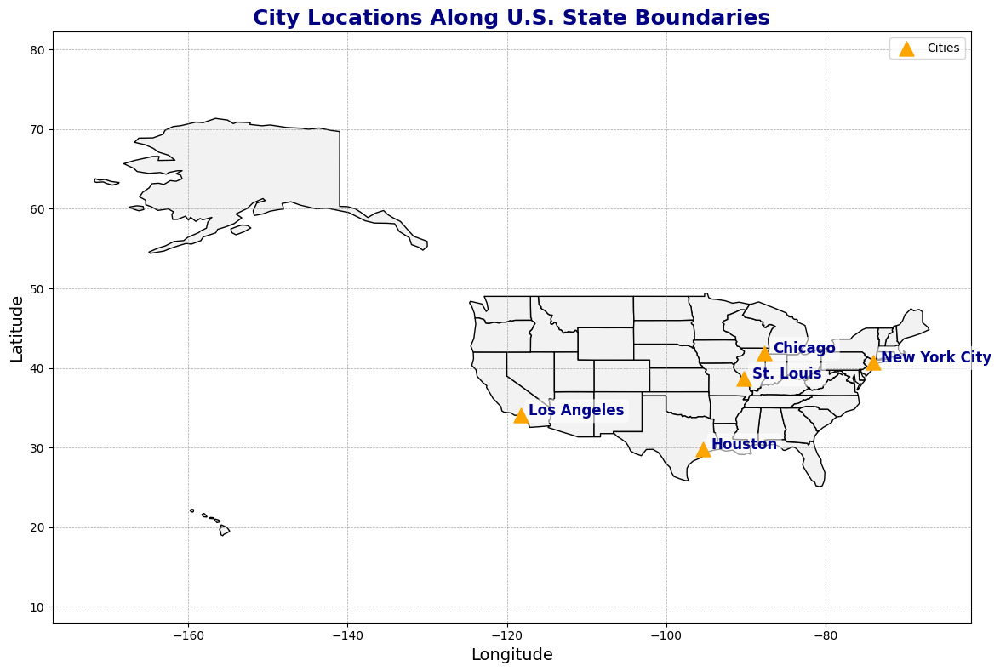

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# Data for cities
cities_data = {
    'City': ['Los Angeles', 'Houston', 'Chicago', 'St. Louis', 'New York City'],
    'Latitude': [34.0522, 29.7604, 41.8781, 38.6270, 40.7128],
    'Longitude': [-118.2437, -95.3698, -87.6298, -90.1994, -74.0060]
}

# Create DataFrame
df_cities = pd.DataFrame(cities_data)

# Convert the DataFrame into GeoDataFrame
gdf = gpd.GeoDataFrame(df_cities, geometry=gpd.points_from_xy(df_cities['Longitude'], df_cities['Latitude']))

# Load the U.S. states shapefile
world = gpd.read_file("ne_110m_admin_1_states_provinces.shp")

# Plot the map
fig, ax = plt.subplots(figsize=(12, 8))

# Use a distinct color palette for the states
world.plot(ax=ax, color='#f2f2f2', edgecolor='black')

# Plot the cities with different marker shapes and sizes
gdf.plot(ax=ax, color='orange', markersize=150, marker='^', label='Cities', zorder=5)

# Annotate city names with a different style
for x, y, label in zip(df_cities['Longitude'], df_cities['Latitude'], df_cities['City']):
    ax.text(x + 1, y, label, fontsize=12, fontweight='bold', color='darkblue',
            bbox=dict(facecolor='white', alpha=0.6, edgecolor='none', boxstyle='round,pad=0.3'))

# Title and labels
plt.title('City Locations Along U.S. State Boundaries', fontsize=18, fontweight='bold', color='navy')
plt.xlabel('Longitude', fontsize=14)
plt.ylabel('Latitude', fontsize=14)
plt.legend(loc='upper right', fontsize=10, frameon=True)
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)
plt.axis('equal')  # Equal aspect ratio ensures that the map is not distorted
plt.tight_layout()  # Adjusts the plot to fit into the figure area
plt.show()


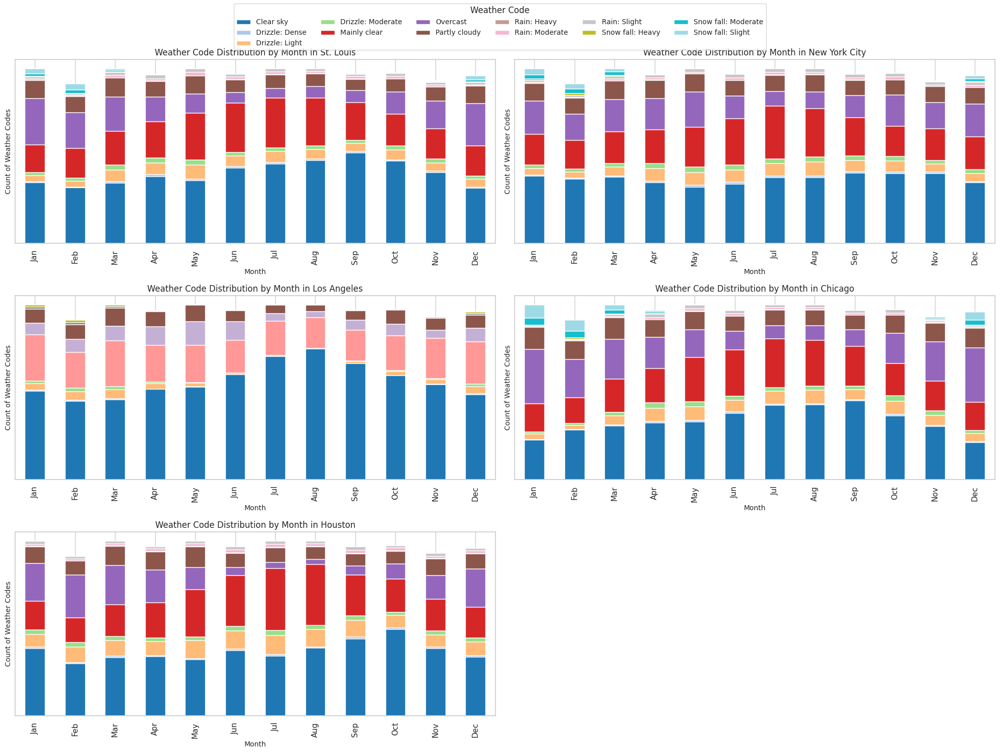

In [ ]:
import matplotlib.pyplot as plt

# Get unique cities
cities = df['location_city'].unique()

# Set up the grid for subplots
num_cities = len(cities)
num_cols = 2
num_rows = (num_cities + num_cols - 1) // num_cols  # Calculate number of rows needed

fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))

# Flatten the axes array for easier indexing
axs = axs.flatten()

# Initialize a variable to hold the legend labels
legend_labels = None

# Loop through each city to create the bar plots
for i, city_name in enumerate(cities):
    city_data = df[df['location_city'] == city_name]

    # Group data by month and weather code
    monthly_weather_code = city_data.groupby(city_data['time'].dt.month)['weather_code'].value_counts().unstack().fillna(0)

    # Plot on individual subplot
    monthly_weather_code.plot(kind='bar', stacked=True, colormap='tab20', ax=axs[i], legend=False)

    # Store legend labels to use later
    if legend_labels is None:
        legend_labels = monthly_weather_code.columns

    # Customize each plot
    axs[i].set_title(f'Weather Code Distribution by Month in {city_name}', fontsize=12)
    axs[i].set_xlabel('Month', fontsize=10)
    axs[i].set_ylabel('Count of Weather Codes', fontsize=10)
    axs[i].set_yticks([])
    axs[i].set_xticks(range(12))
    axs[i].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

    axs[i].grid(True)

# Hide unused subplots
for j in range(num_cities, len(axs)):
    axs[j].set_visible(False)

# Add a single legend outside the plots
fig.legend(legend_labels, title='Weather Code', loc='upper center', ncol=6, fontsize=10)

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave space for the legend
plt.show()


Indicates the weather distribution by each location. We can see that Los Angeles has the maximum number of 'clear sky' days whereas Chicago receives maximum snowfall out of all the locations

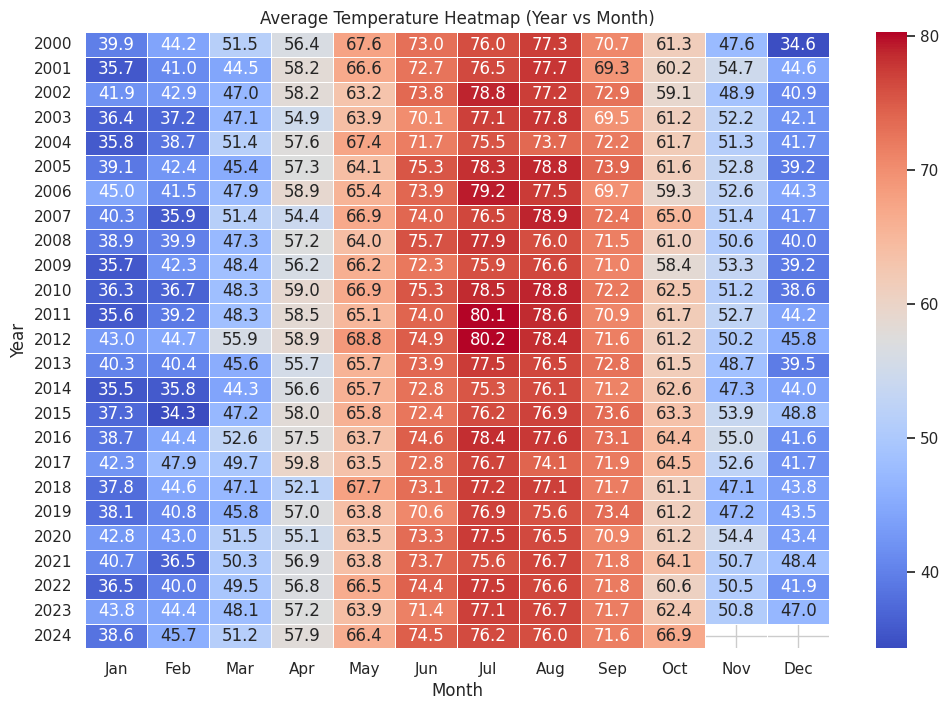

In [ ]:
# Create a pivot table without creating separate columns
temp_pivot = df.pivot_table(values='temp_2m',
                            index=df['time'].dt.year,
                            columns=df['time'].dt.month,
                            aggfunc='mean')

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(temp_pivot, cmap='coolwarm', annot=True, fmt=".1f", linewidths=0.5)
plt.title('Average Temperature Heatmap (Year vs Month)')
plt.xlabel('Month')
plt.xticks(ticks=np.arange(12) + 0.5, labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                                              'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

plt.ylabel('Year')
plt.show()



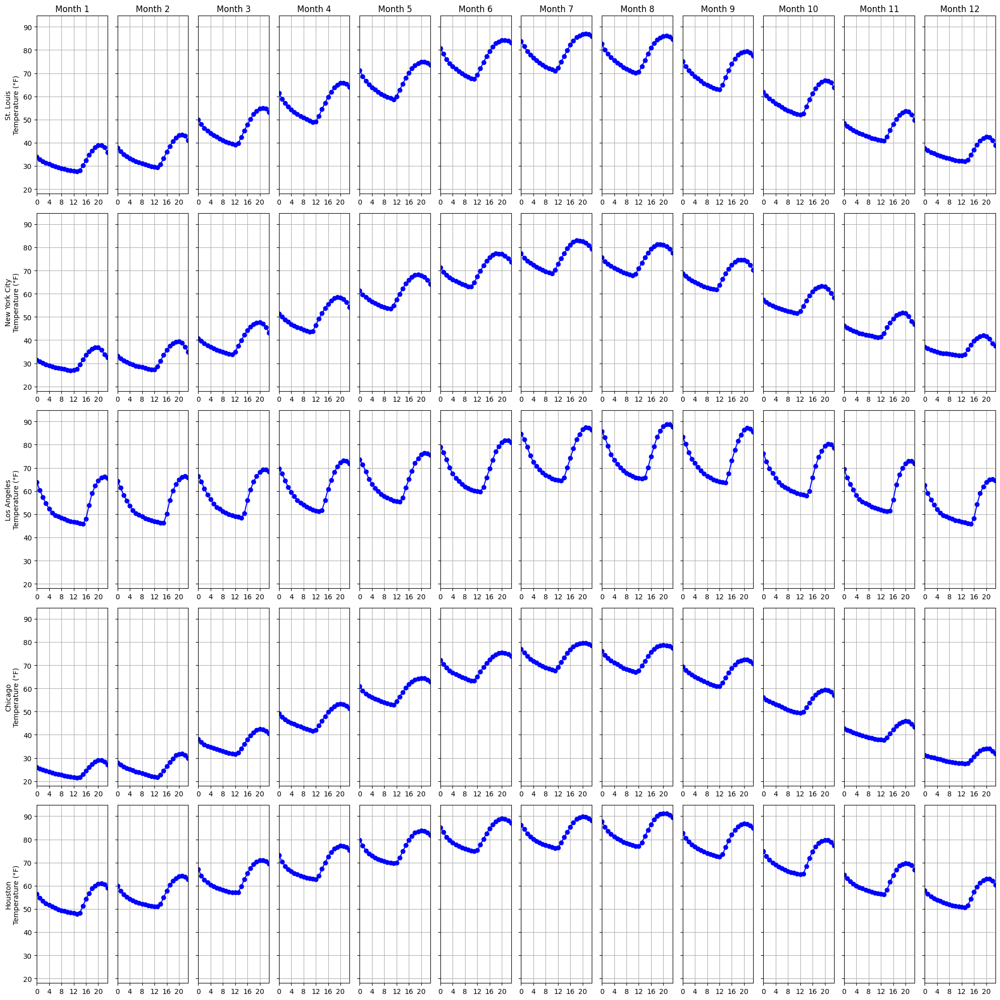

In [25]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure 'time' is in datetime format
df['time'] = pd.to_datetime(df['time'])

# List of unique cities
cities = df['location_city'].unique()



# Create a figure with subplots for each city and month
fig, axs = plt.subplots(len(cities), 12, figsize=(20, 4 * len(cities)), sharey=True)  # One row per city, one column per month

# Loop through each city
for i, city in enumerate(cities):
    city_data = df[df['location_city'] == city]

    # Loop through each month (1 to 12)
    for j, month in enumerate(range(1, 13)):
        # Filter data for the current month
        month_data = city_data[city_data['time'].dt.month == month]

        # Group by hour and calculate the average temperature for each hour
        avg_temp_per_hour = month_data.groupby(month_data['time'].dt.hour)['temp_2m'].mean()

        # Plotting the results in the respective subplot
        axs[i, j].plot(avg_temp_per_hour.index, avg_temp_per_hour.values, marker='o', linestyle='-', color='blue')
         # Set x-ticks to even hours only
        even_hours = avg_temp_per_hour.index[avg_temp_per_hour.index % 4 == 0]
        axs[i, j].set_xticks(even_hours)  # Set x-ticks to even hours only

        axs[i, j].set_xlim(0, 23)  # Set x-axis limits to include all hours from 0 to 23
        axs[i, j].grid()

        # Set title for each subplot
        if i == 0:  # Only add month titles in the top row
            axs[i, j].set_title(f'Month {month}')

        # Label each row with the city name
        if j == 0:
            axs[i, j].set_ylabel(f'{city}\nTemperature (°F)')

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


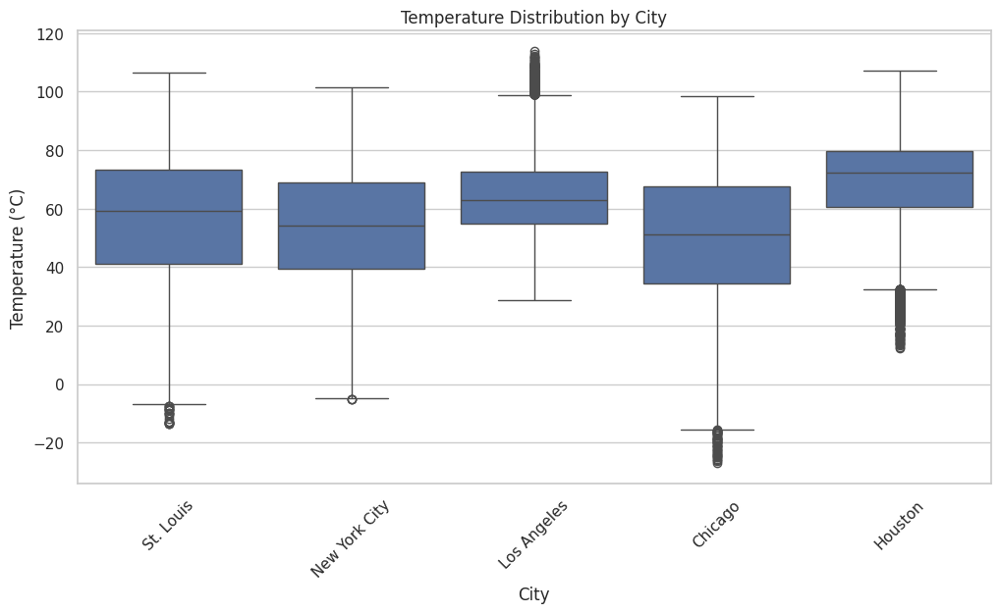

In [ ]:
# Temperature Distribution by City
plt.figure(figsize=(12, 6))
sns.boxplot(x='location_city', y='temp_2m', data=df)
plt.title('Temperature Distribution by City')
plt.xlabel('City')
plt.ylabel('Temperature (°C)')
plt.xticks(rotation=45)
plt.show()


The box plot illustrates temperature variation across different cities, with Houston generally showing a higher median temperature than other locations, and Chicago exhibiting the lowest median temperature. Although Los Angeles has the highest mean temperature, Houston's median temperature remains higher due to some extreme values (outliers) that are impacting Los Angeles's mean.

This distinction highlights the robustness of the median, as it remains unaffected by these outliers, offering a more reliable measure of central tendency in cases where outliers skew the mean.

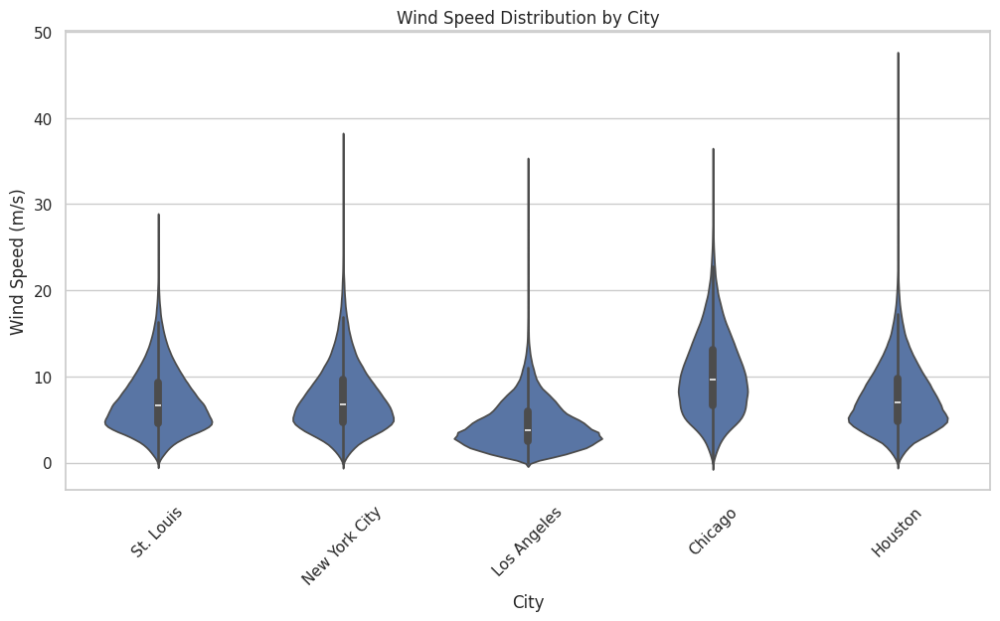

In [ ]:
# Wind Speed Distribution by City
plt.figure(figsize=(12, 6))
sns.violinplot(x='location_city', y='wind_speed_10m', data=df)
plt.title('Wind Speed Distribution by City')
plt.xlabel('City')
plt.ylabel('Wind Speed (m/s)')
plt.xticks(rotation=45)
plt.show()


The violin plot showcases the wind speed distribution across cities, revealing that Los Angeles generally has the lowest wind speeds, while Chicago experiences the highest. Violin plots effectively display both the distribution and density of wind speeds, allowing us to observe variations within each city.

In Los Angeles, the wind speed distribution is relatively narrow, centering around low values, indicating consistent, mild conditions. In contrast, Chicago’s plot shows a wider spread with a higher median wind speed, capturing the city's reputation for stronger winds. This visual helps emphasize the differences in average wind conditions between coastal and inland cities

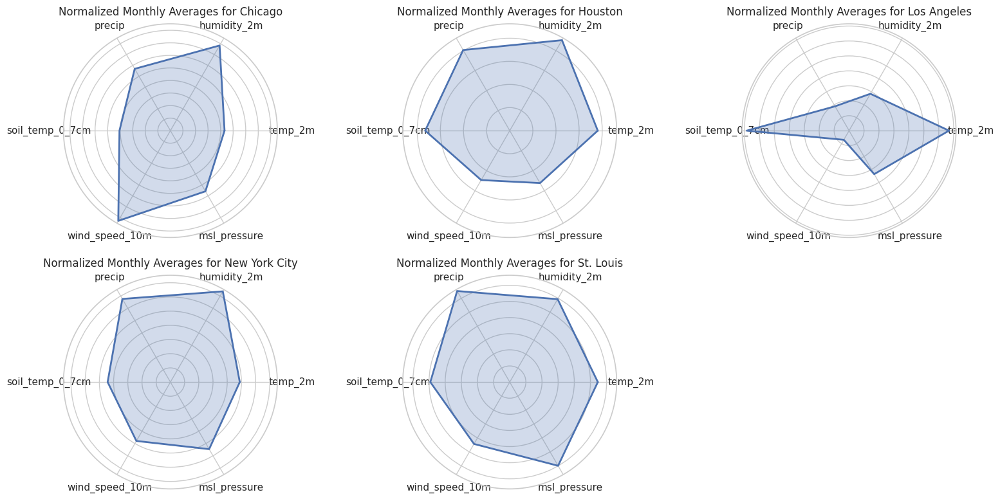

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Select only the specified numeric columns
selected_features = ['temp_2m', 'humidity_2m', 'precip', 'soil_temp_0_7cm', 'wind_speed_10m', 'msl_pressure']

# Calculate monthly averages for all cities
monthly_data = df.groupby(['location_city', df['time'].dt.month])[selected_features].mean().reset_index()

# Normalize the data across all cities
scaler = MinMaxScaler()
normalized_values = scaler.fit_transform(monthly_data[selected_features])

# Add normalized values back to the DataFrame
monthly_data[selected_features] = normalized_values

# Set up the grid for radar charts
cities = monthly_data['location_city'].unique()
num_cities = len(cities)
num_cols = 3
num_rows = 2  # Calculate number of rows needed

fig, axs = plt.subplots(num_rows, num_cols, figsize=(16, 4 * num_rows), subplot_kw=dict(polar=True))

# Flatten the axes array for easier indexing
axs = axs.flatten()

# Loop through each city to create radar charts
for i, city in enumerate(cities):
    city_data = monthly_data[monthly_data['location_city'] == city]

    # Prepare data for radar chart
    labels = selected_features
    values = city_data[selected_features].mean(axis=0).values  # Use mean across all months for each feature

    # Create angles for the radar chart
    angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()

    # Complete the loop for the radar chart
    values = np.concatenate((values, [values[0]]))  # Closing the loop
    angles += angles[:1]  # Closing the loop for angles

    # Plot radar chart
    axs[i].fill(angles, values, alpha=0.25)
    axs[i].plot(angles, values, linewidth=2)

    axs[i].set_yticklabels([])
    axs[i].set_xticks(angles[:-1])  # Remove the last tick
    axs[i].set_xticklabels(labels)
    axs[i].set_title(f'Normalized Monthly Averages for {city}')

for j in range(num_cities, len(axs)):
    axs[j].set_visible(False)
# Adjust layout
plt.tight_layout()
plt.show()


The radar plot provides a comparative, multi-dimensional view of key weather factors across cities.Before plotting, normalizing the data was crucial, as it scales each variable to a common range, ensuring that each feature contributes equally to the visual. Without normalization, variables with larger values could dominate the plot, skewing interpretations.This plot is particularly useful in highlighting relative strengths and weaknesses of each city in terms of weather attributes


This radar plot consists of of the following axes:
1. Temperature
2. Humidity
3. Precipitation
4. Soil temperature at 0.7cm
5. Wind speed at 10m
6. Mean sea level pressure

Key takeaways:
* Chicago - strong wind speed, high precipitation and humidity, lower sea level pressure and temperature
* Houston - low wind speed and sea level pressure, high humidity, temperature and soil temperature.
* Los Angeles - high temperature and sea level pressure, low humidity,temperature and precipitation.
* New York - High humidity and soil temperature, moderate precipitation and wind speed.
* St Louis - High soil temperature(explains the Cicada outbreak), balanced humidity, temperature and sea level pressure, slightly lower wind speed and precipitation.

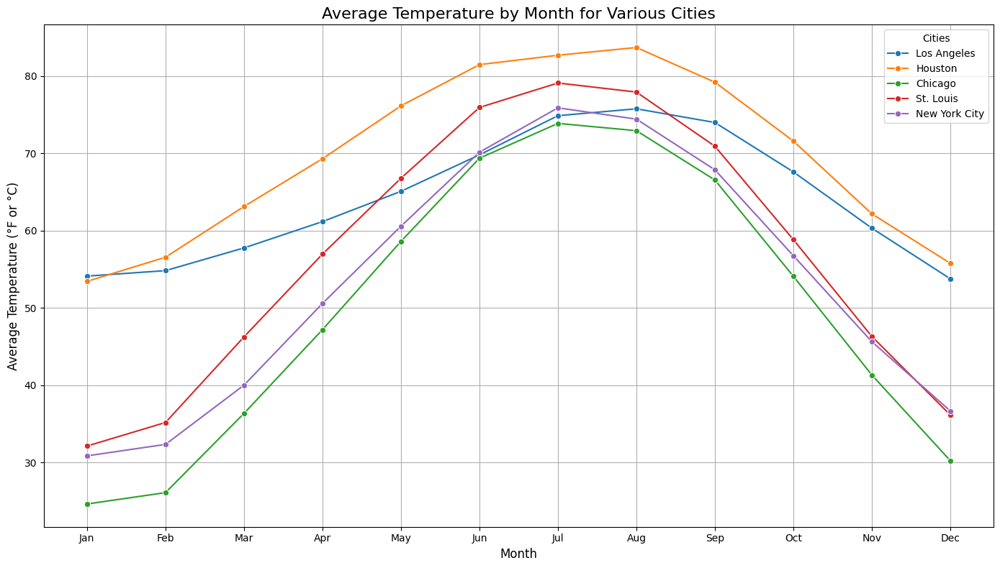

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Sample DataFrame creation (replace this with your actual DataFrame)
# df = pd.read_csv('your_data.csv', parse_dates=['time_column'])  # Example for loading your data
# Ensure that your DataFrame has 'location_city', 'temperature', and 'time' columns

# Example of the cities to plot
cities = ['Los Angeles', 'Houston', 'Chicago', 'St. Louis', 'New York City']

# Create a figure
plt.figure(figsize=(14, 8))

# Loop through the cities and plot
for city_name in cities:
    # Filter data for the specific city
    city_data = df[df['location_city'] == city_name]

    # Extract month from the 'time' column
    city_data['month'] = city_data['time'].dt.month  # Ensure 'time' is a datetime type

    # Group by month and calculate average temperature
    monthly_avg = city_data.groupby('month')['temp_2m'].mean().reset_index()  # Replace 'temp_2m' with your temperature column

    # Plot the data
    sns.lineplot(data=monthly_avg, x='month', y='temp_2m', marker='o', label=city_name)

# Adding labels and title
plt.title('Average Temperature by Month for Various Cities', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Average Temperature (°F )', fontsize=12)
plt.xticks(range(1, 13), [
    'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
    'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'
])
plt.legend(title='Cities')
plt.grid(True)

# Adjust layout and show plot
plt.tight_layout()
plt.show()


This line plot effectively captures the seasonal temperature patterns for each city. Across all cities, we observe a clear seasonality in temperature, with peaks in the summer months of June, July, and August, and troughs during the winter months of December, January, and February. This seasonality aligns with typical temperate climate cycles, where summer temperatures rise and winter temperatures drop sharply.

Comparing across cities:

* Houston consistently has the highest average temperatures throughout the year due to its warmer, subtropical climate.
* Chicago generally experiences the lowest temperatures, reflecting its midwestern location, which exposes it to colder winter weather patterns.

An interesting factor highlighted in this plot is the extreme seasonal temperature variation in St. Louis. During summer (June through August), temperatures in St. Louis often surpass those in Los Angeles, showing intense summer heat. Conversely, in the winter (December through February), temperatures in St. Louis drop significantly lower than those in Los Angeles, showing St. Louis's susceptibility to both summer heat and winter cold.

# **Univariate plot**

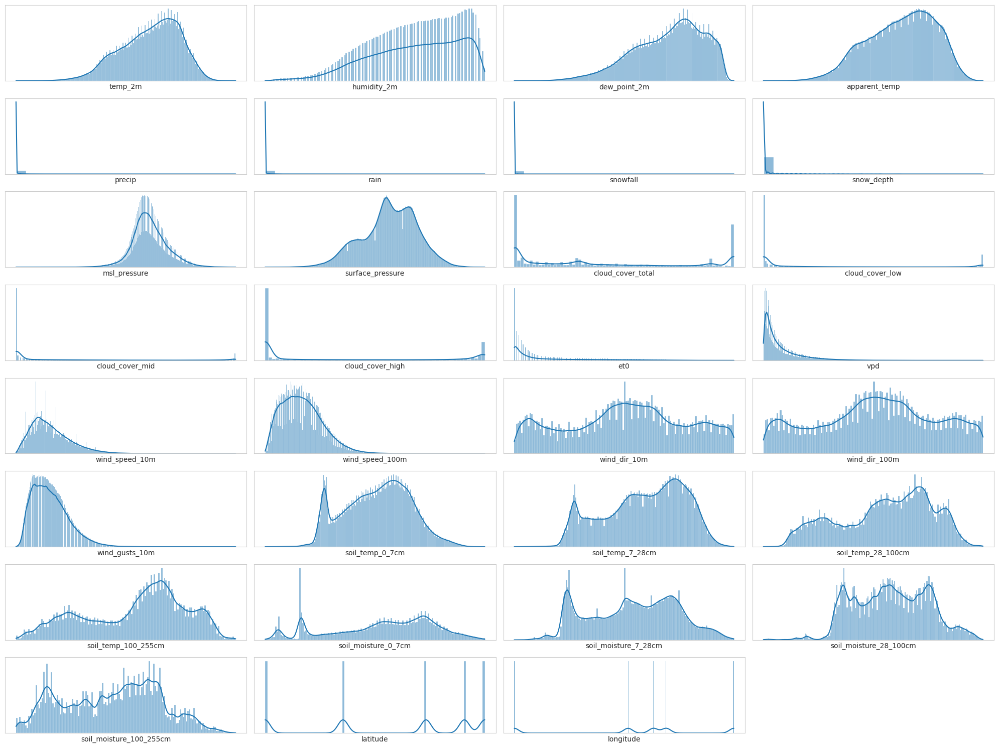

In [ ]:


color = sns.color_palette("viridis")
sns.set_style("whitegrid", {'axes.grid' : False})
fig, ax1 = plt.subplots(8,4,  figsize=(20, 15))
k = 0
# Select numeric columns only
columns = df.select_dtypes(include=['number']).columns

for i in range(8):
    for j in range(4):
        if k < len(columns):

            ax=sns.histplot(x=df[columns[k]],ax=ax1[i][j],kde=True)
            ax.set_ylabel(None); ax.set_yticks([])
            ax.set_xticks([])

            k += 1

        else:
            ax1[i][j].set_visible(False)

plt.tight_layout()
plt.show()


This plot illustrates the distribution of all features in the dataset. Features such as temp_2m, msl_pressure, wind_speed, and dew_point_2m show a normal distribution, while others, like VPD, exhibit skewness.








# **Skewness - Feature Transformation**

In [ ]:
def log_transform(col):
    return np.log(col[0])

df['vpd'] = df[['vpd']].apply(log_transform, axis=1)


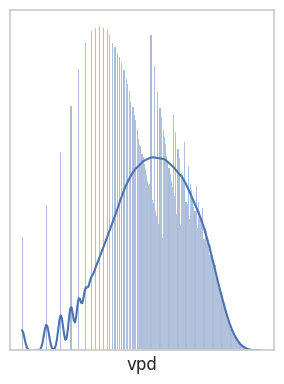

In [ ]:
color = sns.color_palette("viridis")
sns.set_style("whitegrid", {'axes.grid' : False})
fig, axs = plt.subplots(1, 1, figsize=(3, 4), sharex=True)




sns.histplot(x=df['vpd'], kde=True)
axs.set_ylabel(None); axs.set_yticks([])
axs.set_xticks([])



plt.tight_layout()
plt.show()

Log transformed the feature 'vpd' to check for skewness

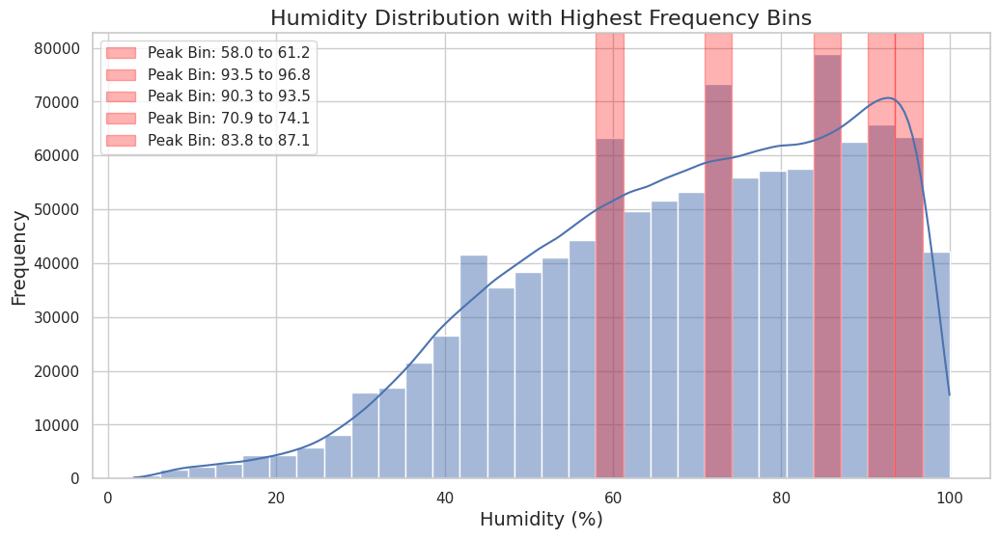

Top 5 Bins with Highest Frequency:
Bin: 58.0 to 61.2 - Count: 63339
Bin: 93.5 to 96.8 - Count: 63368
Bin: 90.3 to 93.5 - Count: 65698
Bin: 70.9 to 74.1 - Count: 73244
Bin: 83.8 to 87.1 - Count: 78806


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt



# Calculate histogram
counts, bin_edges = np.histogram(df['humidity_2m'], bins=30)

# Get the indices of the top 5 bins with the highest frequency
top_5_bin_indices = np.argsort(counts)[-5:]  # Get indices of the top 5 counts

# Extract the top 5 bins
top_5_bins = [(bin_edges[i], bin_edges[i + 1]) for i in top_5_bin_indices]

# Plot the distribution with peaks highlighted
plt.figure(figsize=(12, 6))
sns.histplot(df['humidity_2m'], bins=30, kde=True)
plt.title('Humidity Distribution with Highest Frequency Bins', fontsize=16)
plt.xlabel('Humidity (%)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid()

# Highlighting the top 5 bins
for bin_range in top_5_bins:
    plt.axvspan(bin_range[0], bin_range[1], color='red', alpha=0.3, label=f'Peak Bin: {bin_range[0]:.1f} to {bin_range[1]:.1f}')

# Show the legend
plt.legend()
plt.show()

# Print the top 5 bins with highest frequency
print("Top 5 Bins with Highest Frequency:")
for bin_range in top_5_bins:
    print(f'Bin: {bin_range[0]:.1f} to {bin_range[1]:.1f} - Count: {counts[np.where(bin_edges[:-1] == bin_range[0])[0][0]]}')


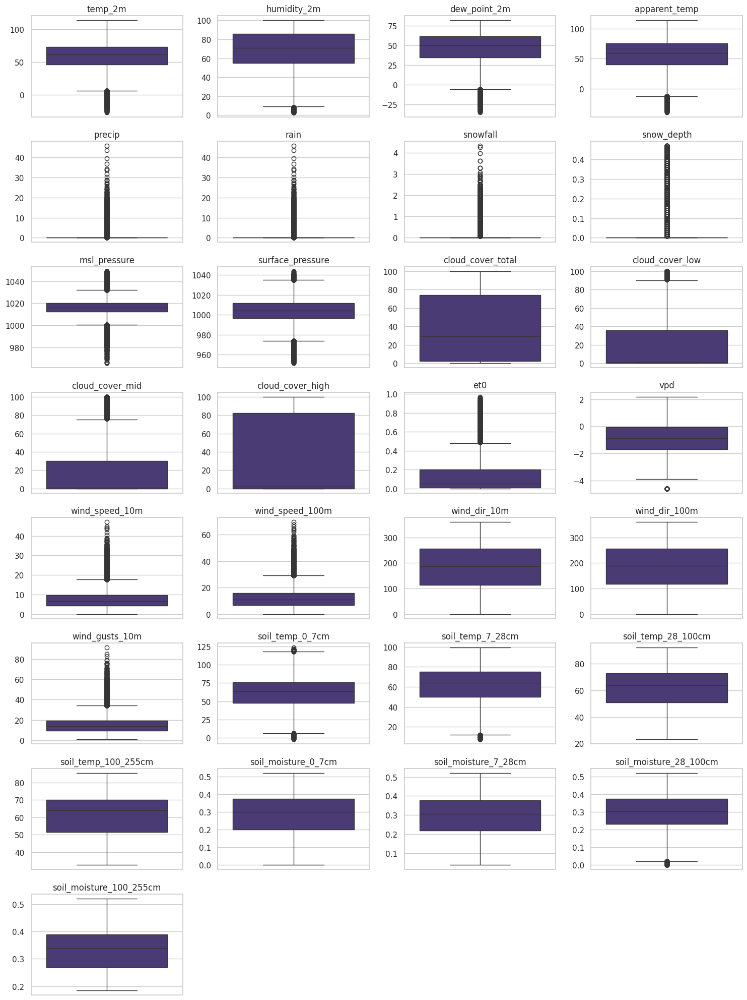

In [ ]:
# Select numeric columns only
columns = df.select_dtypes(include=['number']).columns


color = sns.color_palette("viridis")
sns.set_style("whitegrid")

fig, ax1 = plt.subplots(8, 4, figsize=(15, 20))
k = 0

for i in range(8):
    for j in range(4):
        if k < len(columns):
            sns.boxplot(y=df[columns[k]], ax=ax1[i][j], palette=color)
            ax1[i][j].set_title(columns[k])
            ax1[i][j].set_ylabel(None)
            ax1[i][j].set_xlabel(None)
            k += 1
        else:
            ax1[i][j].set_visible(False)

plt.tight_layout()
plt.show()


The box plot indicates there are outliers especially the points outside the IQR range.. we see lot of these values in precipitation, rain, msl_pressure. Further analysis is required to analyze whether we really need to remove these outliers. In this report we will detect outliers on these following methods

1- Domain or looking at distribution over time plots

2- IQR Range

3- Mahalanobis Distance

4- MCD


# Outlier detection through Time plots

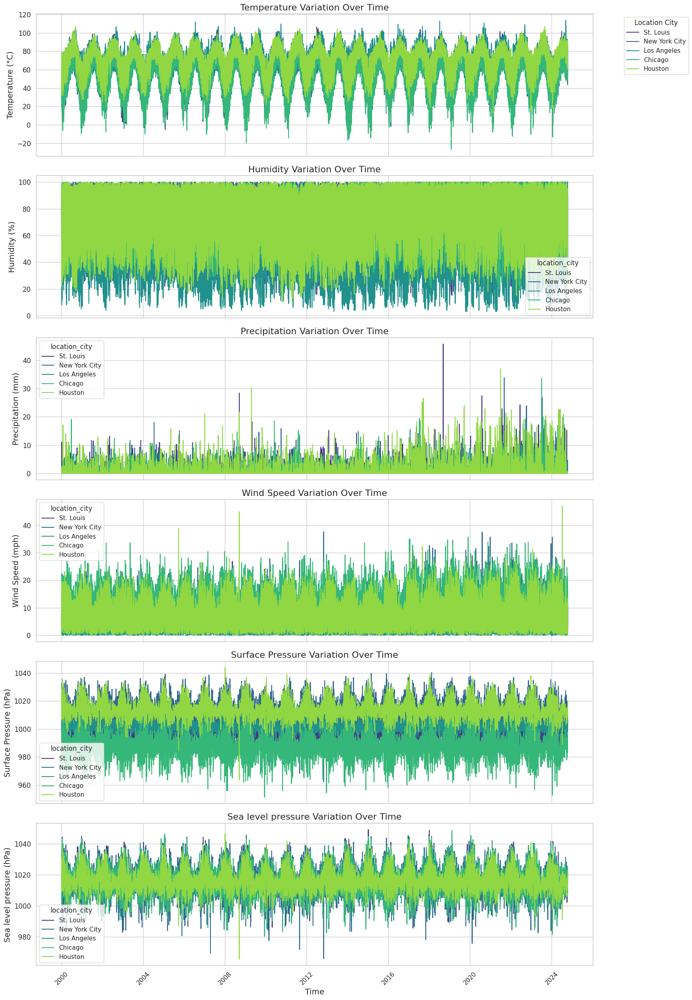

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style of the plots
sns.set(style='whitegrid')

# Create a figure with subplots
fig, axs = plt.subplots(6, 1, figsize=(15, 25), sharex=True)  # Adjusted size for clarity

# Plot Temperature
sns.lineplot(data=df, x='time', y='temp_2m', hue='location_city', ax=axs[0], palette='viridis')
axs[0].set_title('Temperature Variation Over Time', fontsize=16)
axs[0].set_ylabel('Temperature (°C)', fontsize=14)
axs[0].tick_params(axis='y', which='both', labelsize=12)  # Increase y-tick label size

# Plot Humidity
sns.lineplot(data=df, x='time', y='humidity_2m', hue='location_city', ax=axs[1], palette='viridis')
axs[1].set_title('Humidity Variation Over Time', fontsize=16)
axs[1].set_ylabel('Humidity (%)', fontsize=14)
axs[1].tick_params(axis='y', which='both', labelsize=12)  # Increase y-tick label size

# Plot Precipitation
sns.lineplot(data=df, x='time', y='precip', hue='location_city', ax=axs[2], palette='viridis')
axs[2].set_title('Precipitation Variation Over Time', fontsize=16)
axs[2].set_ylabel('Precipitation (mm)', fontsize=14)
axs[2].tick_params(axis='y', which='both', labelsize=12)  # Increase y-tick label size

# Plot Wind Speed
sns.lineplot(data=df, x='time', y='wind_speed_10m', hue='location_city', ax=axs[3], palette='viridis')
axs[3].set_title('Wind Speed Variation Over Time', fontsize=16)
axs[3].set_ylabel('Wind Speed (mph)', fontsize=14)
axs[3].tick_params(axis='y', which='both', labelsize=12)  # Increase y-tick label size

# Plot Surface Pressure
sns.lineplot(data=df, x='time', y='surface_pressure', hue='location_city', ax=axs[4], palette='viridis')
axs[4].set_title('Surface Pressure Variation Over Time', fontsize=16)
axs[4].set_ylabel('Surface Pressure (hPa)', fontsize=14)
axs[4].tick_params(axis='y', which='both', labelsize=12)  # Increase y-tick label size

# Plot Surface Pressure
sns.lineplot(data=df, x='time', y='msl_pressure', hue='location_city', ax=axs[5], palette='viridis')
axs[5].set_title('Sea level pressure Variation Over Time', fontsize=16)
axs[5].set_ylabel('Sea level pressure (hPa)', fontsize=14)
axs[5].tick_params(axis='y', which='both', labelsize=12)  # Increase y-tick label size
# Set x-axis label
axs[5].set_xlabel('Time', fontsize=14)

# Show the plots
plt.xticks(rotation=45)
plt.tight_layout()

# Move the legend outside to avoid clutter
axs[0].legend(title='Location City', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()


It shows the seasonlity patter of  temperature, sea level and surface pressure across years

This plot highlights instances of extreme rainfall on specific days. For example, in St. Louis on September 8th, there was a significant rainfall event. Another instance occurred in Houston, also on September 13th, marking notable cases of extreme weather in these areas.

In [ ]:
df[df['wind_speed_10m'] >= 40]

,time,temp_2m,humidity_2m,dew_point_2m,apparent_temp,precip,rain,snowfall,snow_depth,weather_code,...,wind_gusts_10m,soil_temp_0_7cm,soil_temp_7_28cm,soil_temp_28_100cm,soil_temp_100_255cm,soil_moisture_0_7cm,soil_moisture_7_28cm,soil_moisture_28_100cm,soil_moisture_100_255cm,location_city
945173,2008-09-13 05:00:00,78.4,88,74.5,71.3,6.4,6.4,0.0,0.0,Rain: Moderate,...,75.8,83.6,87.6,84.7,80.6,0.319,0.290,0.309,0.413,Houston
945174,2008-09-13 06:00:00,77.6,90,74.4,69.5,12.9,12.9,0.0,0.0,Rain: Heavy,...,91.3,82.6,87.4,84.7,80.6,0.447,0.290,0.309,0.413,Houston
945175,2008-09-13 07:00:00,76.3,91,73.6,67.3,17.0,17.0,0.0,0.0,Rain: Heavy,...,83.0,81.8,87.1,84.8,80.6,0.520,0.292,0.309,0.413,Houston
945176,2008-09-13 08:00:00,75.9,91,73.2,68.6,21.6,21.6,0.0,0.0,Rain: Heavy,...,84.8,81.2,86.7,84.8,80.6,0.503,0.381,0.309,0.413,Houston
1083829,2024-07-08 13:00:00,77.8,90,74.7,70.2,15.5,15.5,0.0,0.0,Rain: Heavy,...,74.0,77.2,82.3,83.6,75.0,0.520,0.520,0.380,0.421,Houston
1083830,2024-07-08 14:00:00,75.4,89,72.1,66.0,10.3,10.3,0.0,0.0,Rain: Heavy,...,70.2,77.0,82.0,83.5,75.0,0.510,0.518,0.391,0.421,Houston
1083831,2024-07-08 15:00:00,74.2,90,71.2,63.0,4.9,4.9,0.0,0.0,Rain: Moderate,...,78.7,76.3,81.7,83.5,75.1,0.502,0.517,0.397,0.421,Houston


In [ ]:
df.loc[(df['precip'] > 40)]

,time,temp_2m,humidity_2m,dew_point_2m,apparent_temp,precip,rain,snowfall,snow_depth,weather_code,...,wind_gusts_10m,soil_temp_0_7cm,soil_temp_7_28cm,soil_temp_28_100cm,soil_temp_100_255cm,soil_moisture_0_7cm,soil_moisture_7_28cm,soil_moisture_28_100cm,soil_moisture_100_255cm,location_city
163804,2018-09-08 04:00:00,71.7,93,69.7,75.8,45.7,45.7,0.0,0.0,Rain: Heavy,...,21.0,75.4,77.9,77.2,72.5,0.439,0.439,0.276,0.341,St. Louis
163805,2018-09-08 05:00:00,71.3,94,69.5,74.7,43.5,43.5,0.0,0.0,Rain: Heavy,...,22.4,75.0,77.7,77.2,72.5,0.439,0.439,0.287,0.341,St. Louis


In this analysis, we're retaining outliers in the dataset, as these reflect real, significant weather events, such as the extreme rainfall observed on specific days. Retaining these outliers is essential for building an accurate and robust weather forecasting model, as these events play a critical role in understanding the full range of weather patterns and anomalies, which are invaluable for model training and prediction.








In [ ]:

precip_counts = df['precip'].value_counts()[:]

plt.figure(figsize=(8, 8))
plt.pie(precip_counts, labels=precip_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Top 5 Precipitation Values')
plt.axis('equal')

plt.show()

## **Outlier detection through IQR range**

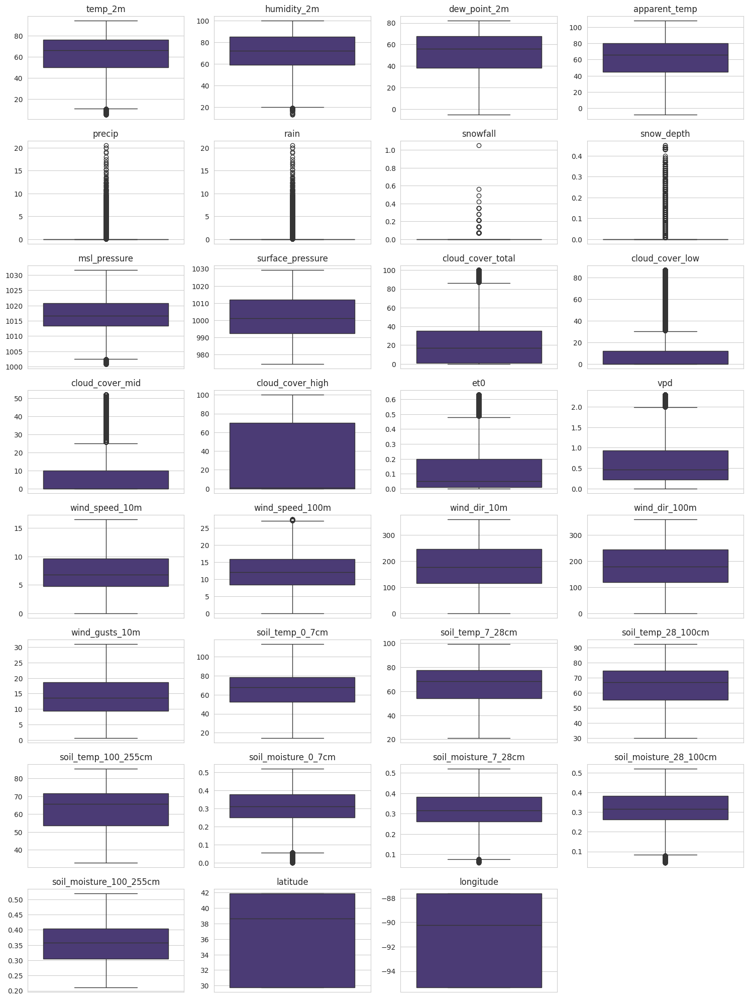

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


df_filtered = df.copy()

# Define a function to filter out outliers based on IQR
def remove_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]

# List of columns to remove outliers from
columns_to_filter = [col for col in df_filtered.select_dtypes(include=['number']).columns if col not in ['precip', 'rain', 'snowfall', 'snow_depth']]


# Remove outliers for specified columns
for col in columns_to_filter:
    df_filtered = remove_outliers_iqr(df_filtered, col)


columns=df_filtered.select_dtypes(include=['number']).columns


color = sns.color_palette("viridis")
sns.set_style("whitegrid")

fig, ax1 = plt.subplots(8, 4, figsize=(15, 20))
k = 0

for i in range(8):
    for j in range(4):
        if k < len(columns):
            sns.boxplot(y=df_filtered[columns[k]], ax=ax1[i][j], palette=color)
            ax1[i][j].set_title(columns[k])
            ax1[i][j].set_ylabel(None)
            ax1[i][j].set_xlabel(None)
            k += 1
        else:
            ax1[i][j].set_visible(False)

plt.tight_layout()
plt.show()

The application of the IQR method for outlier removal has led to the exclusion of points that might naturally occur in weather data, which is problematic for our analysis. For instance, wind speeds exceeding 20 mph can indicate tornado activity, a legitimate weather phenomenon that should not be disregarded. Similarly, temperatures falling below 0°F are typical during winter months (December and January) in many cities, where cold snaps are expected.

Given these observations, we recognize that the IQR method may not be suitable for our dataset, as it incorrectly categorizes these significant weather events as outliers. Thus, we will avoid using the IQR method for outlier detection in our analysis.

## **Outlier detection through MCD and Mahalanobis distance**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import chi2
from sklearn.covariance import MinCovDet

# Mahalanobis distance function
def calculate_mahalanobis(data, mean, cov_matrix):
    inv_cov_matrix = np.linalg.inv(cov_matrix)
    distances = []
    for i in range(data.shape[0]):
        diff = data[i] - mean
        dist = np.sqrt(np.dot(np.dot(diff, inv_cov_matrix), diff.T))
        distances.append(dist)
    return np.array(distances)

# Detect outliers using Mahalanobis Distance
def detect_outliers_mahalanobis(df, threshold=0.99):
    data = df.values
    mean = np.mean(data, axis=0)
    cov_matrix = np.cov(data, rowvar=False)
    distances = calculate_mahalanobis(data, mean, cov_matrix)

    chi_squared_threshold = chi2.ppf(threshold, df=data.shape[1])
    outliers = np.where(distances > np.sqrt(chi_squared_threshold))

    return outliers[0], distances

# Detect outliers using MCD
def detect_outliers_mcd(df, threshold=0.99):
    data = df.values
    mcd = MinCovDet().fit(data)
    distances = mcd.mahalanobis(data)

    # Calculate the threshold based on chi-squared distribution
    threshold = np.sqrt(chi2.ppf(threshold, df=data.shape[1]))
    outliers = np.where(np.sqrt(distances) > threshold)

    return outliers[0], np.sqrt(distances)

# Select numeric columns
selected_columns = ['temp_2m',  'dew_point_2m', 'soil_temp_0_7cm']

# Select only the specified numeric columns
df_numeric = df[selected_columns].select_dtypes(include=[np.number])

# Mahalanobis outliers
outliers_mahalanobis, mahalanobis_distances = detect_outliers_mahalanobis(df_numeric, threshold=0.99)

# MCD outliers
outliers_mcd, mcd_distances = detect_outliers_mcd(df_numeric, threshold=0.99)

# Store the results in separate variables or DataFrames
mahalanobis_results = pd.DataFrame({
    'MahalanobisDistance': mahalanobis_distances,
    'MahalanobisOutlier': np.isin(np.arange(len(mahalanobis_distances)), outliers_mahalanobis)
})

mcd_results = pd.DataFrame({
    'MCDDistance': mcd_distances,
    'MCDOutlier': np.isin(np.arange(len(mcd_distances)), outliers_mcd)
})



   MahalanobisDistance  MahalanobisOutlier
0             1.276869               False
1             1.291068               False
2             1.327321               False
3             1.380485               False
4             1.421256               False
   MCDDistance  MCDOutlier
0     1.508742       False
1     1.444768       False
2     1.455602       False
3     1.516456       False
4     1.565857       False


In this context, we have used Mahalanobis distance to detect outilers. As studied in class, Mahalanobis distance is the distance between a point from the mean of the values. If the distance is very high, it means that the point is an outlier. In the weather forecasting dataset, it is difficult to distinguish between outliers as most of the data present means something and it is very difficult to remove these points. As seen in the above table, there arent' any outliers in our dataset. High Mahalanobis values indicate potential outliers, but in our weather dataset, these values often reflect actual significant events, such as extreme temperatures or rainfall, which are meaningful for model accuracy

To further assess outliers, we used the Minimum Covariance Determinant (MCD) method, considered one of the most robust outlier detection techniques. MCD works by finding the subset of data with the smallest determinant of the covariance matrix, which provides a thresholded range around the data based on a chosen quantile (0.99 in our case). Points outside this range are flagged as outliers. MCD is highly robust because it minimizes the influence of extreme values, making it particularly suited for datasets where distinguishing genuine anomalies from noise is challenging. In our case, MCD analysis also indicated no clear outliers, reinforcing that our dataset’s variability represents actual weather patterns rather than errors.




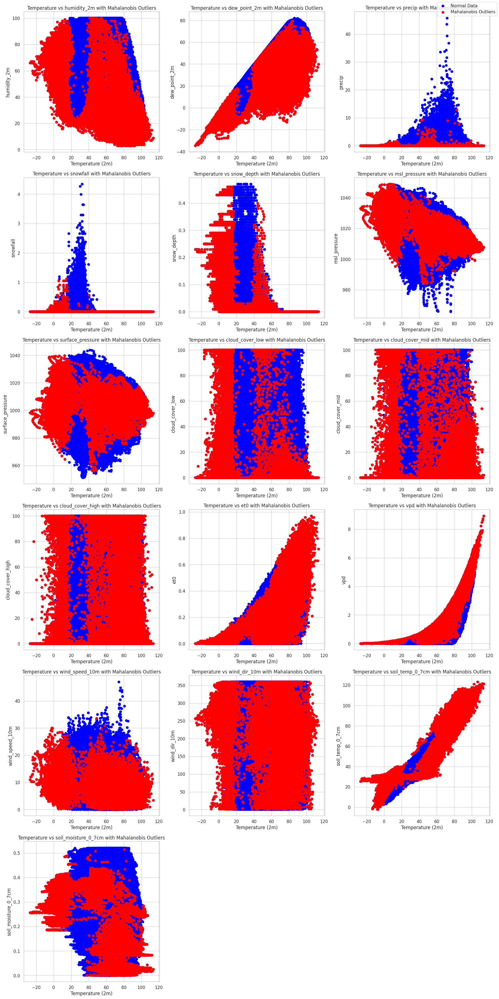

In [ ]:

# Define number of rows and columns for subplots
n_cols = 3
n_rows = int(np.ceil((len(df_numeric.columns) - 1) / n_cols))  # Adjust rows based on the number of columns to plot

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 6))  # Adjust size based on number of rows
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Loop through all columns except temperature
plot_index = 0
for col in df_numeric.columns:
    if col != 'temp_2m':
        ax = axes[plot_index]  # Select current subplot
        ax.scatter(df_numeric['temp_2m'], df_numeric[col], c='blue', label='Normal Data')

        # Highlight the Mahalanobis outliers
        ax.scatter(df_numeric['temp_2m'].iloc[outliers_mahalanobis], df_numeric[col].iloc[outliers_mahalanobis],
                   c='red', label='Mahalanobis Outliers')

        # Set subplot title and labels
        ax.set_title(f'Temperature vs {col} with Mahalanobis Outliers')
        ax.set_xlabel('Temperature (2m)')
        ax.set_ylabel(col)

        plot_index += 1  # Move to the next subplot

# Remove any unused subplots if there are fewer than n_rows * n_cols
for i in range(plot_index, len(axes)):
    fig.delaxes(axes[i])

# Add a legend only once (outside the subplots)
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')

# Adjust layout
plt.tight_layout()
plt.show()





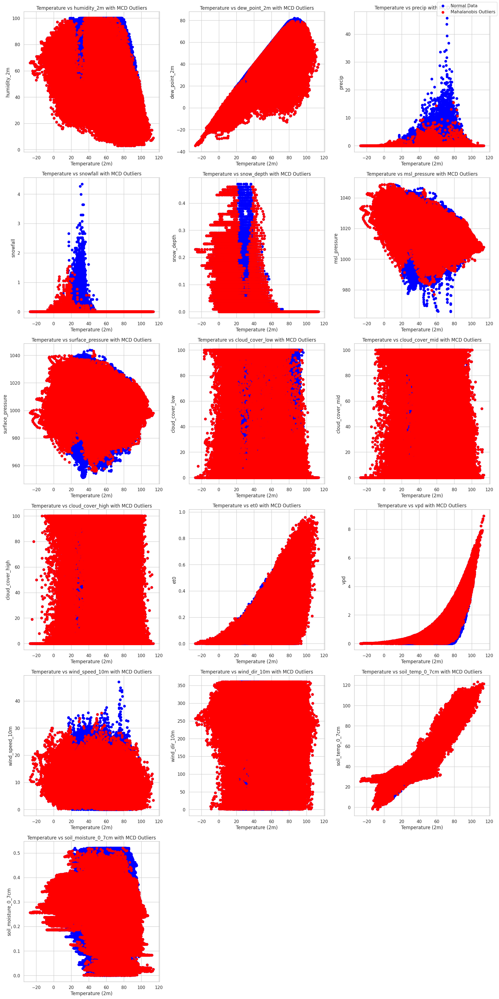

In [ ]:

# Define number of rows and columns for subplots
n_cols = 3
n_rows = int(np.ceil((len(df_numeric.columns) - 1) / n_cols))  # Adjust rows based on the number of columns to plot

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 6))  # Adjust size based on number of rows
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Loop through all columns except temperature
plot_index = 0
for col in df_numeric.columns:
    if col != 'temp_2m':
        ax = axes[plot_index]  # Select current subplot
        ax.scatter(df_numeric['temp_2m'], df_numeric[col], c='blue', label='Normal Data')

        # Highlight the Mahalanobis outliers
        ax.scatter(df_numeric['temp_2m'].iloc[outliers_mcd], df_numeric[col].iloc[outliers_mcd],
                   c='red', label='Mahalanobis Outliers')

        # Set subplot title and labels
        ax.set_title(f'Temperature vs {col} with MCD Outliers')
        ax.set_xlabel('Temperature (2m)')
        ax.set_ylabel(col)

        plot_index += 1  # Move to the next subplot

# Remove any unused subplots if there are fewer than n_rows * n_cols
for i in range(plot_index, len(axes)):
    fig.delaxes(axes[i])

# Add a legend only once (outside the subplots)
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')

# Adjust layout
plt.tight_layout()
plt.show()









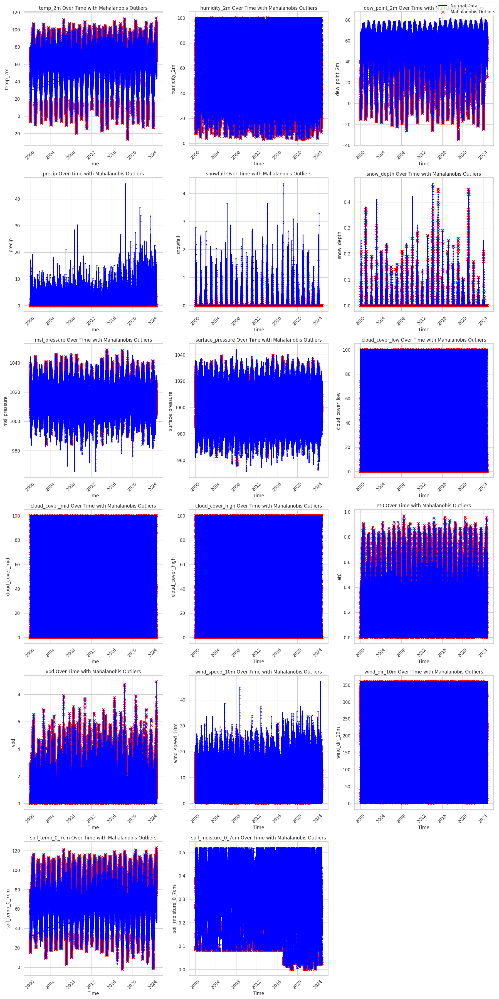

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define number of rows and columns for subplots
n_cols = 3
n_rows = int(np.ceil(len(df_numeric.columns) / n_cols))  # Adjust rows based on the number of columns to plot

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 6))  # Adjust size based on number of rows
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Loop through all numeric columns for univariate plots against time
plot_index = 0
for col in df_numeric.columns:
    ax = axes[plot_index]  # Select current subplot

    # Plot the normal data for each feature against time
    ax.plot(df['time'], df_numeric[col], c='blue', label='Normal Data', marker='o', markersize=2)

    # Highlight the Mahalanobis outliers
    outlier_times = df['time'].iloc[outliers_mahalanobis]
    ax.scatter(outlier_times, df_numeric[col].iloc[outliers_mahalanobis],
               c='red', label='Mahalanobis Outliers', marker='x', s=50)

    # Set subplot title and label
    ax.set_title(f'{col} Over Time with Mahalanobis Outliers')
    ax.set_xlabel('Time')
    ax.set_ylabel(col)
    ax.tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability

    plot_index += 1  # Move to the next subplot

# Remove any unused subplots if there are fewer than n_rows * n_cols
for i in range(plot_index, len(axes)):
    fig.delaxes(axes[i])

# Add a legend only once (outside the subplots)
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')

# Adjust layout
plt.tight_layout()
plt.show()


This plot shows us how the Mahalnobis distance considers outliers... and we see that all the peaks in temp vs tim were considered as outliers.

# Feature selection

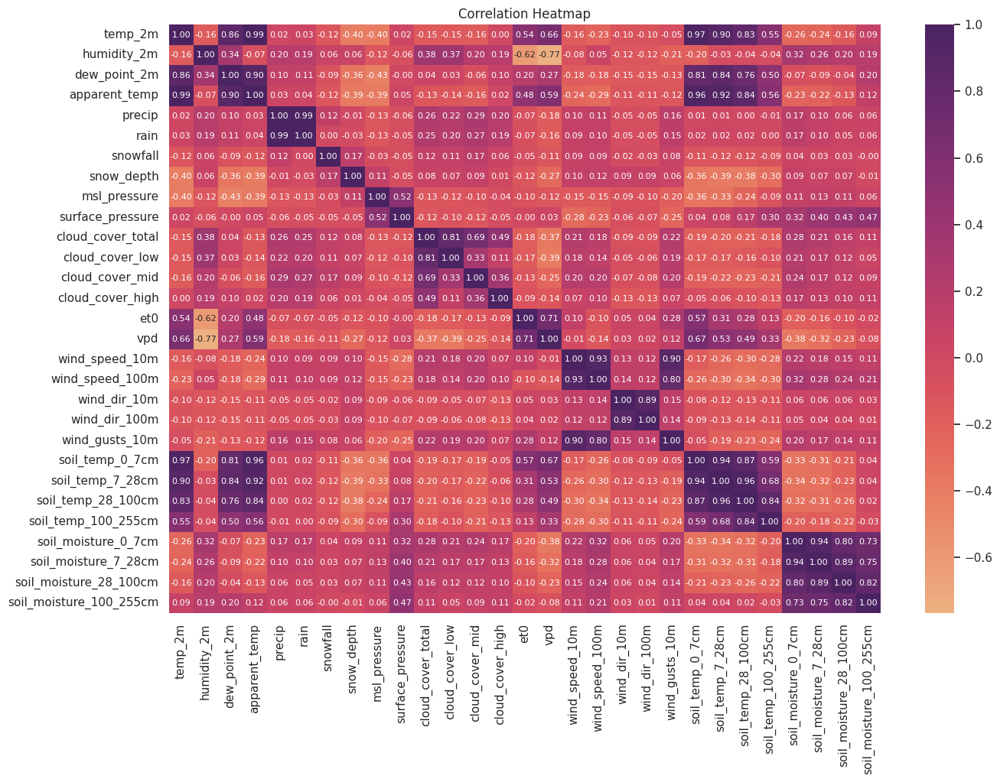

In [ ]:
df_numeric = df.select_dtypes(include=[np.number])

sns.set(font_scale = 1)
correlation_matrix = df_numeric.corr()
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='flare', fmt=".2f",annot_kws={"size": 8})
plt.title('Correlation Heatmap')
plt.show()

From the correlation map the following fetaure among themselves shows high correlation


* Precipation, rain

* Wind_Speed 10m,100m and gust

* win direction 10m, 100m

* Due_point and apparent_temp(2m)

* Soil temperature at various depths

* Soil moisture ata various depth

* cloud_over total with mid,low and high

# Wind Analysis

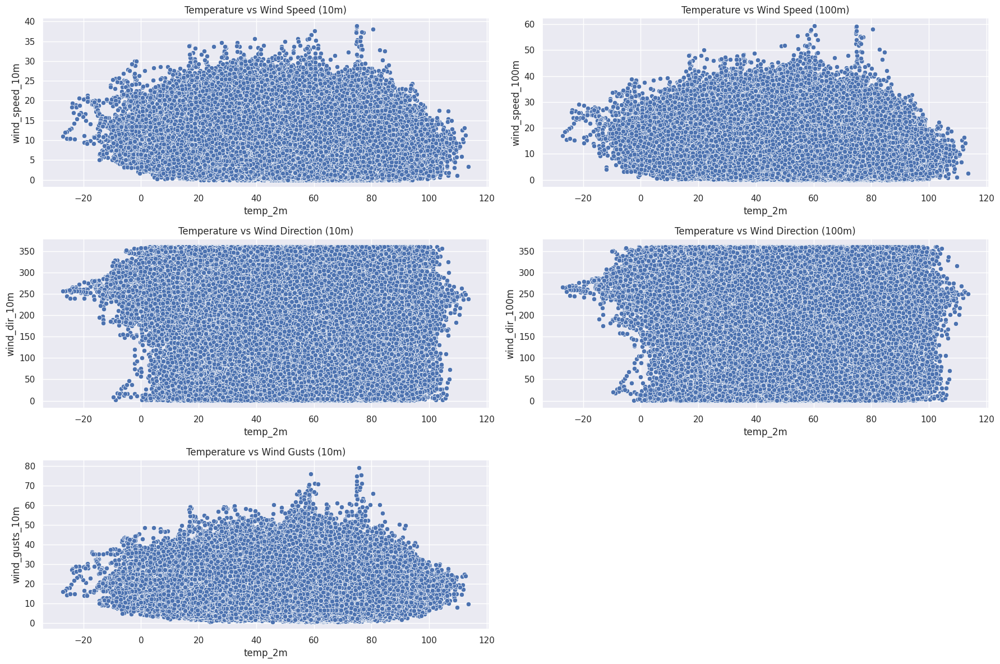

In [ ]:
plt.figure(figsize=(18, 12))

# Temperature vs Wind Speed at 10m
plt.subplot(3, 2, 1)
sns.scatterplot(x='temp_2m', y='wind_speed_10m', data=df)
plt.title('Temperature vs Wind Speed (10m)')

# Temperature vs Wind Speed at 100m
plt.subplot(3, 2, 2)
sns.scatterplot(x='temp_2m', y='wind_speed_100m', data=df)
plt.title('Temperature vs Wind Speed (100m)')

# Temperature vs Wind Direction at 10m
plt.subplot(3, 2, 3)
sns.scatterplot(x='temp_2m', y='wind_dir_10m', data=df)
plt.title('Temperature vs Wind Direction (10m)')

# Temperature vs Wind Direction at 100m
plt.subplot(3, 2, 4)
sns.scatterplot(x='temp_2m', y='wind_dir_100m', data=df)
plt.title('Temperature vs Wind Direction (100m)')

# Temperature vs Wind Gusts at 10m
plt.subplot(3, 2, 5)
sns.scatterplot(x='temp_2m', y='wind_gusts_10m', data=df)
plt.title('Temperature vs Wind Gusts (10m)')

plt.tight_layout()
plt.show()

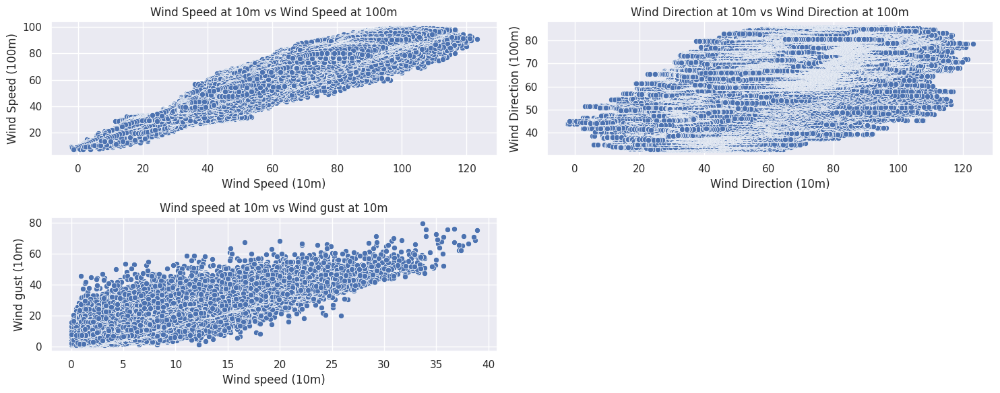

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set up the figure with two subplots
plt.figure(figsize=(15, 6))

# Scatter plot for Wind Speed at 10m vs Wind Speed at 100m
plt.subplot(2, 2, 1)
sns.scatterplot(x='soil_temp_0_7cm', y='soil_temp_7_28cm', data=df)
plt.title('Wind Speed at 10m vs Wind Speed at 100m')
plt.xlabel('Wind Speed (10m)')
plt.ylabel('Wind Speed (100m)')
plt.grid(True)

# Scatter plot for Wind Direction at 10m vs Wind Direction at 100m
plt.subplot(2, 2, 2)
sns.scatterplot(x='soil_temp_0_7cm', y='soil_temp_100_255cm', data=df)
plt.title('Wind Direction at 10m vs Wind Direction at 100m')
plt.xlabel('Wind Direction (10m)')
plt.ylabel('Wind Direction (100m)')


plt.subplot(2, 2, 3)
sns.scatterplot(x='wind_speed_10m', y='wind_gusts_10m', data=df)
plt.title('Wind speed at 10m vs Wind gust at 10m')
plt.xlabel('Wind speed (10m)')
plt.ylabel('Wind gust (10m)')
plt.grid(True)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()



# Wind Speed Analysis:

There is a relationship between wind_speed_10m and wind_speed_100m.
Therefore, we will keep only one variable, removing wind_speed_100m.
Wind Direction Analysis:

The scatter plot shows that there is a high correlation between win_dir 100 and 10m..so will keep only one

The relationship between wind_speed_10m and wind_gusts_10m is not linear at lower wind speeds.Despite that there is a correlation as per scatter plot

# Soil analysis

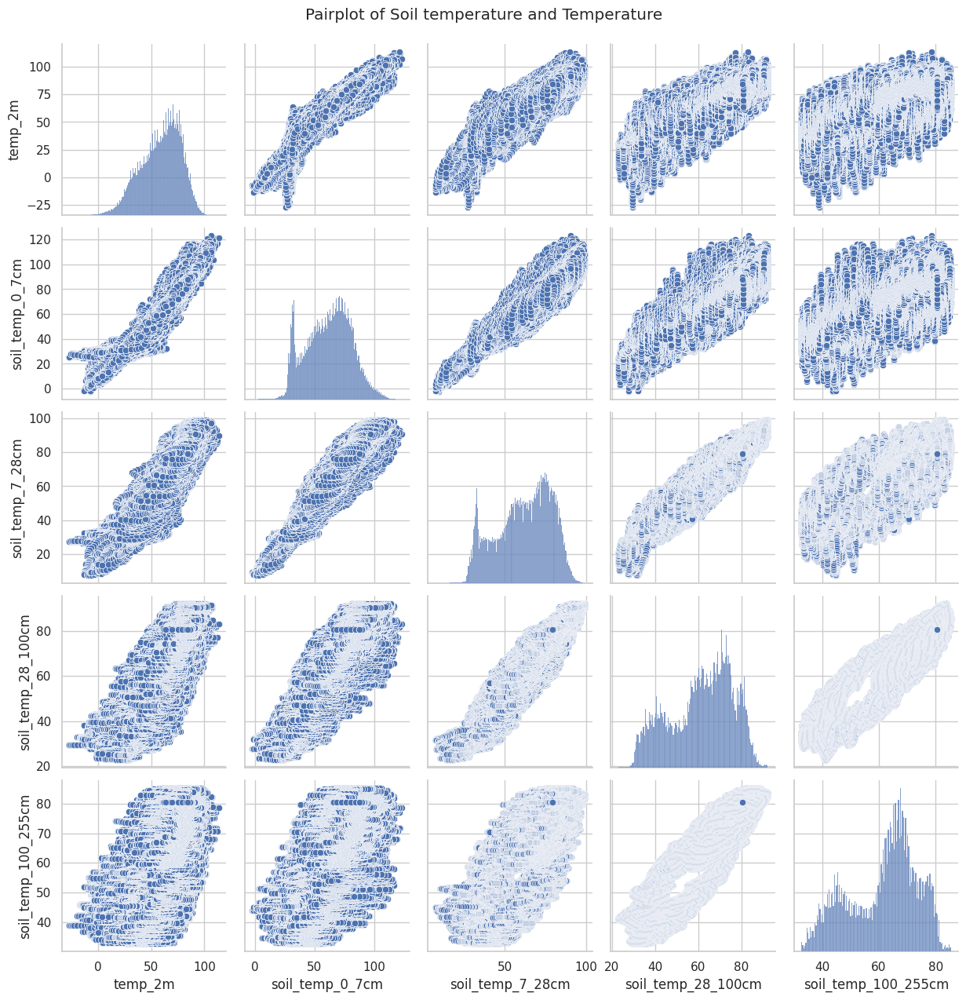

In [ ]:
# Combine the lists of moisture and temperature columns
features_to_plot = moisture_columns = ["temp_2m",
    'soil_temp_0_7cm',
    'soil_temp_7_28cm',
    'soil_temp_28_100cm',
    'soil_temp_100_255cm'
]
# Create the pairplot
sns.set(style="whitegrid")
pairplot = sns.pairplot(df[features_to_plot])
plt.suptitle('Pairplot of Soil temperature and Temperature', y=1.02)
plt.show()

Accounting to fact that there is some coorelation exist between temp at each  depth..Im taking only 0-7m ..correspodning to highest correlation factor with temperature

# Moisture analysis

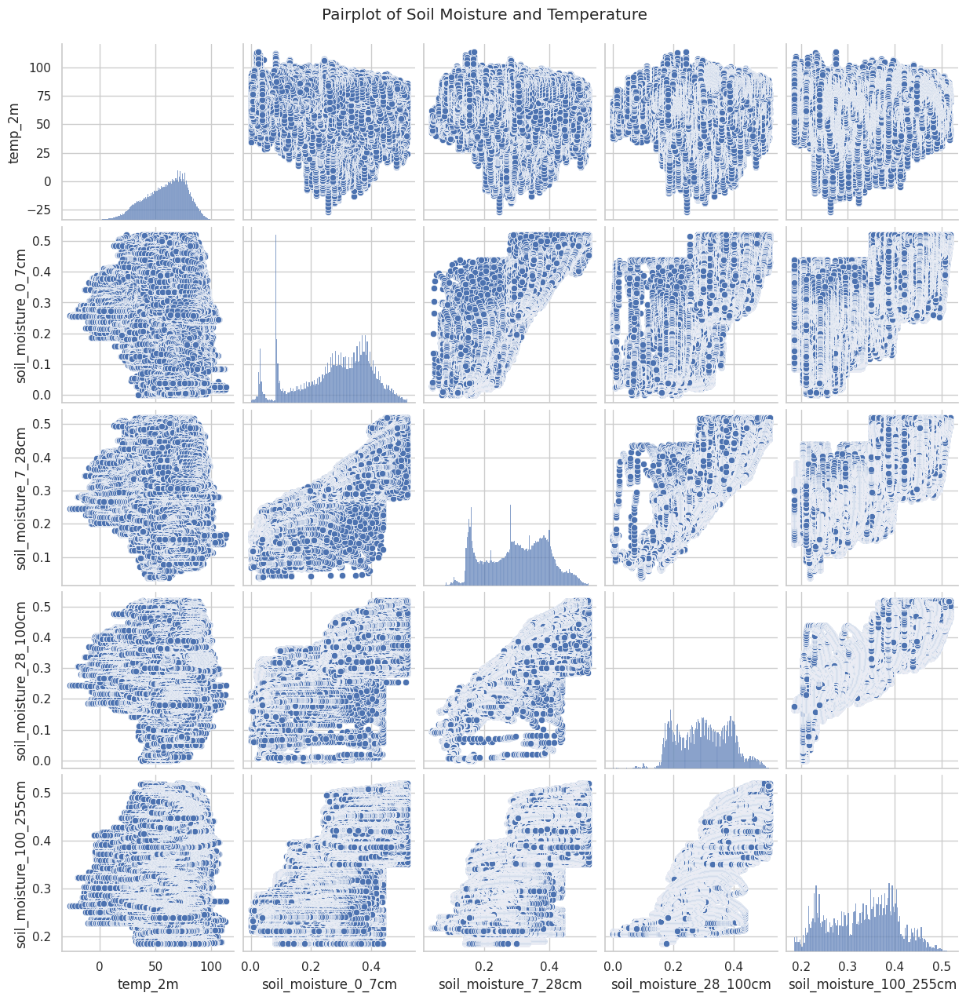

In [ ]:
# Combine the lists of moisture and temperature columns
features_to_plot = moisture_columns = ["temp_2m",
    'soil_moisture_0_7cm',
    'soil_moisture_7_28cm',
    'soil_moisture_28_100cm',
    'soil_moisture_100_255cm'
]

# Create the pairplot
sns.set(style="whitegrid")
pairplot = sns.pairplot(df[features_to_plot])
plt.suptitle('Pairplot of Soil Moisture and Temperature', y=1.02)
plt.show()

# Removing features

In [ ]:
df.drop([ 'soil_moisture_7_28cm',
    'soil_moisture_28_100cm',
    'soil_moisture_100_255cm','soil_temp_7_28cm',
    'soil_temp_28_100cm',
    'soil_temp_100_255cm','wind_gusts_10m','wind_speed_100m','wind_dir_100m','rain','apparent_temp','cloud_cover_total'],axis=1,inplace=True)

In [ ]:
df.columns

Index(['time', 'temp_2m', 'humidity_2m', 'dew_point_2m', 'precip', 'snowfall',
       'snow_depth', 'weather_code', 'msl_pressure', 'surface_pressure',
       'cloud_cover_low', 'cloud_cover_mid', 'cloud_cover_high', 'et0', 'vpd',
       'wind_speed_10m', 'wind_dir_10m', 'soil_temp_0_7cm',
       'soil_moisture_0_7cm', 'location_city'],
      dtype='object')

# Feature encoding

In [35]:
df = pd.get_dummies(df, columns=['weather_code'], prefix='weather')

# Display the updated DataFrame
df.head()

,time,temp_2m,humidity_2m,dew_point_2m,apparent_temp,precip,rain,snowfall,snow_depth,msl_pressure,...,weather_Drizzle: Moderate,weather_Mainly clear,weather_Overcast,weather_Partly cloudy,weather_Rain: Heavy,weather_Rain: Moderate,weather_Rain: Slight,weather_Snow fall: Heavy,weather_Snow fall: Moderate,weather_Snow fall: Slight
0,2000-01-01T00:00,41.9,69,32.4,35.9,0.0,0.0,0.0,0.0,1019.6,...,False,False,False,False,False,False,False,False,False,False
1,2000-01-01T01:00,39.5,74,31.9,33.0,0.0,0.0,0.0,0.0,1019.1,...,False,False,False,False,False,False,False,False,False,False
2,2000-01-01T02:00,37.7,78,31.4,30.8,0.0,0.0,0.0,0.0,1019.1,...,False,False,False,False,False,False,False,False,False,False
3,2000-01-01T03:00,36.4,80,30.9,29.3,0.0,0.0,0.0,0.0,1018.9,...,False,False,False,False,False,False,False,False,False,False
4,2000-01-01T04:00,35.5,82,30.4,28.1,0.0,0.0,0.0,0.0,1019.0,...,False,False,False,False,False,False,False,False,False,False


## Data Preprocessing insights

As seen in the above illustrations, most of our data is structured and readable, minimizing the need for extensive preprocessing. We have encoded the weather codes to convert them into numerical values but we have excluded them from our analysis. We also didn't have many missing/null values. The only null values that were observed have been converted to zeroes. We have also log transformed 'vpd' ( vapor pressure deficit) to normalize our graph.

We employed four outlier detection methods: the Interquartile Range (IQR), Minimum Covariance Determinant (MCD), Mahalanobis distance, and time series visualizations. Ultimately, these methods indicated that our dataset did not contain any outliers, as the data points appear to be a natural reflection of weather phenomena. This suggests that the extremes we observed are legitimate occurrences rather than anomalies.

We further did feature removal and analysis using correlation and retained some important features.

In the next section we will focus on seasonality, trends and resiudals

## Seasonality

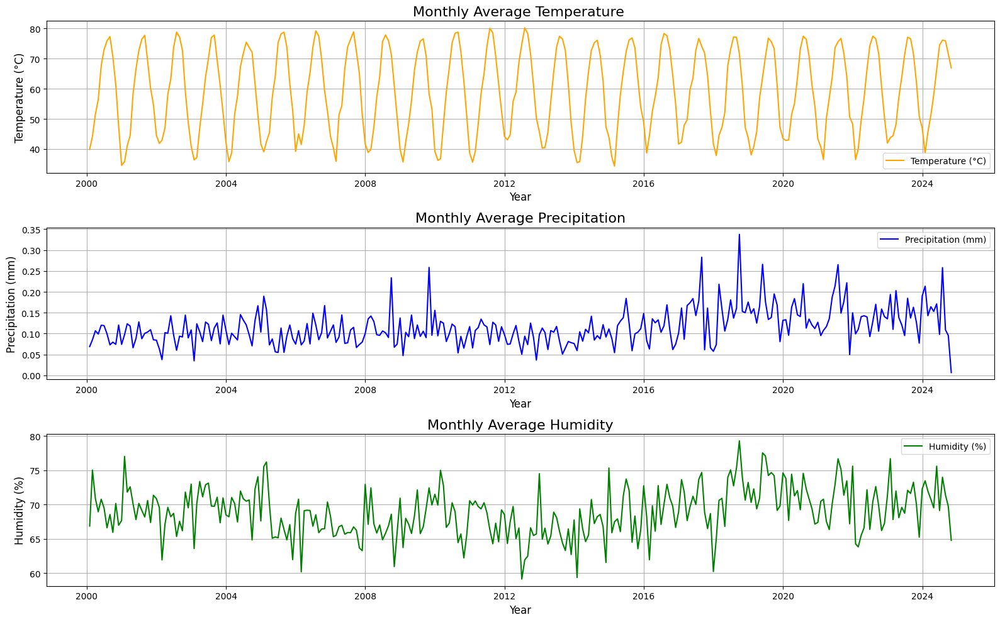

In [48]:
import pandas as pd
import matplotlib.pyplot as plt



df.set_index('time', inplace=True)


# Step 3: Resample the data by month to compute mean values
monthly_data = df.select_dtypes(include=[np.number]).resample('M').mean()

# Step 4: Create a plot for temperature, precipitation, and humidity
plt.figure(figsize=(16, 10))

# Plot temperature
plt.subplot(3, 1, 1)
plt.plot(monthly_data.index, monthly_data['temp_2m'], color='orange', label='Temperature (°C)')
plt.title('Monthly Average Temperature ', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Temperature (°C)', fontsize=12)
plt.grid()
plt.legend()

# Plot precipitation
plt.subplot(3, 1, 2)
plt.plot(monthly_data.index, monthly_data['precip'], color='blue', label='Precipitation (mm)')
plt.title('Monthly Average Precipitation', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Precipitation (mm)', fontsize=12)
plt.grid()
plt.legend()

# Plot humidity
plt.subplot(3, 1, 3)
plt.plot(monthly_data.index, monthly_data['humidity_2m'], color='green', label='Humidity (%)')
plt.title('Monthly Average Humidity', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Humidity (%)', fontsize=12)
plt.grid()
plt.legend()

# Adjust layout
plt.tight_layout()
plt.show()


## Trends

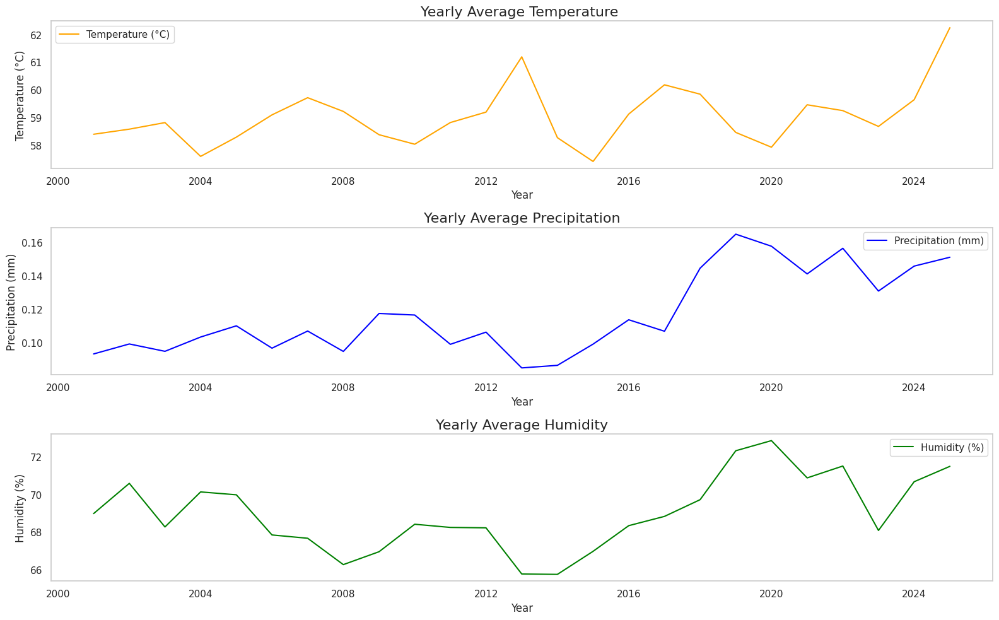

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt






# Step 3: Resample the data by month to compute mean values
monthly_data = df.select_dtypes(include=[np.number]).resample('Y').mean()

# Step 4: Create a plot for temperature, precipitation, and humidity
plt.figure(figsize=(16, 10))

# Plot temperature
plt.subplot(3, 1, 1)
plt.plot(monthly_data.index, monthly_data['temp_2m'], color='orange', label='Temperature (°C)')
plt.title('Yearly Average Temperature ', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Temperature (°C)', fontsize=12)
plt.grid()
plt.legend()

# Plot precipitation
plt.subplot(3, 1, 2)
plt.plot(monthly_data.index, monthly_data['precip'], color='blue', label='Precipitation (mm)')
plt.title('Yearly Average Precipitation', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Precipitation (mm)', fontsize=12)
plt.grid()
plt.legend()

# Plot humidity
plt.subplot(3, 1, 3)
plt.plot(monthly_data.index, monthly_data['humidity_2m'], color='green', label='Humidity (%)')
plt.title('Yearly Average Humidity', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Humidity (%)', fontsize=12)
plt.grid()
plt.legend()

# Adjust layout
plt.tight_layout()
plt.show()


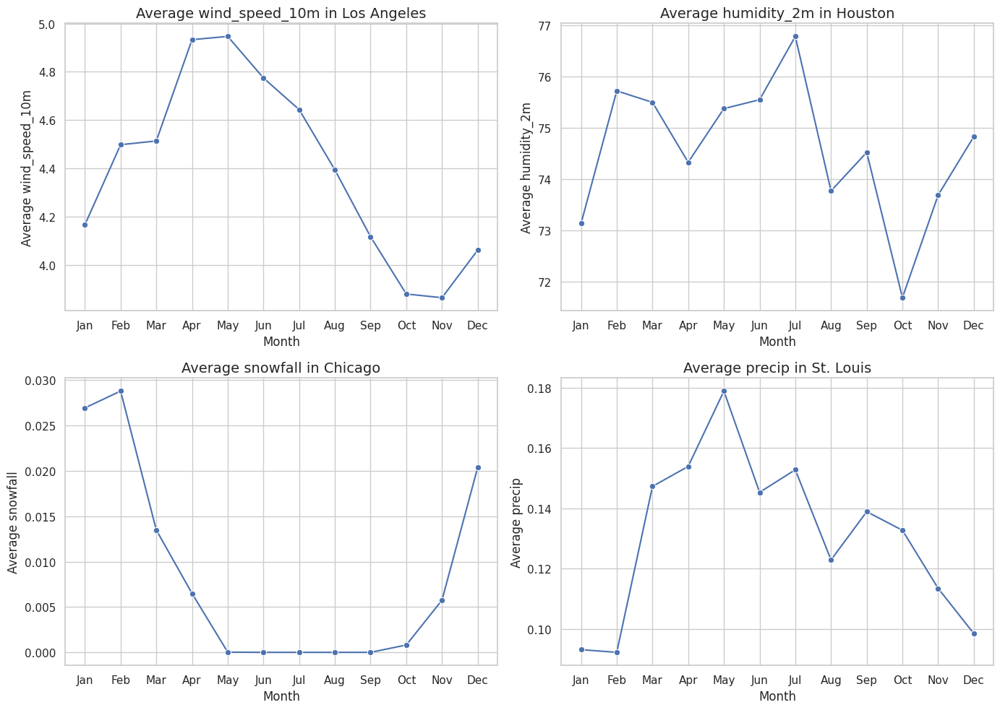

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# Define the cities and their respective variables
cities = {
    'Los Angeles': 'wind_speed_10m',
    'Houston': 'humidity_2m',
    'Chicago': 'snowfall',
    'St. Louis': 'precip'  # Assuming 'precip' represents rainfall
}

# Create a figure for subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 10))  # 2 rows, 2 columns
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Loop through the cities and plot
for ax, (city_name, variable) in zip(axes, cities.items()):
    # Filter data for the specific city
    city_data = df[df['location_city'] == city_name]

    # Extract month from the index and group by month
    city_data['month'] = city_data.index.month
    monthly_avg = city_data.groupby('month')[variable].mean().reset_index()

    # Plot the data
    sns.lineplot(data=monthly_avg, x='month', y=variable, ax=ax, marker='o')

    # Adding labels and title
    ax.set_title(f'Average {variable} in {city_name}', fontsize=14)
    ax.set_xlabel('Month', fontsize=12)
    ax.set_ylabel(f'Average {variable}', fontsize=12)
    ax.set_xticks(range(1, 13))
    ax.set_xticklabels([
        'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
        'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'
    ])
    ax.grid(True)

# Adjust layout
plt.tight_layout()
plt.show()


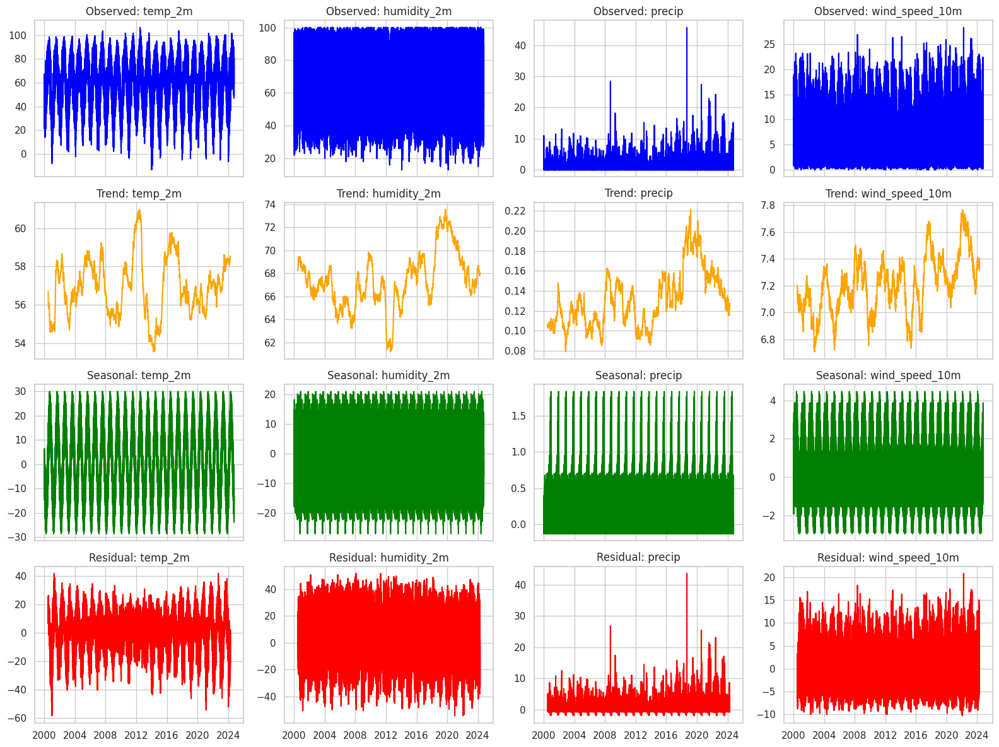

In [ ]:
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Filter data for "St. Louis"
st_louis_data = df[df['location_city'] == 'St. Louis']

# Columns to decompose
columns_to_decompose = ['temp_2m', 'humidity_2m', 'precip', 'wind_speed_10m']

# Create a grid for subplots (4 rows for Observed, Trend, Seasonal, Residual and N columns for each variable)
fig, axes = plt.subplots(4, len(columns_to_decompose), figsize=(16, 12), sharex=True)

# Loop through each column to decompose and plot
for i, column in enumerate(columns_to_decompose):
    decomposition = seasonal_decompose(st_louis_data[column], model='additive', period=8640)

    # Plot Observed
    axes[0, i].plot(decomposition.observed, color='blue')
    axes[0, i].set_title(f'Observed: {column}')

    # Plot Trend
    axes[1, i].plot(decomposition.trend, color='orange')
    axes[1, i].set_title(f'Trend: {column}')

    # Plot Seasonal
    axes[2, i].plot(decomposition.seasonal, color='green')
    axes[2, i].set_title(f'Seasonal: {column}')

    # Plot Residual
    axes[3, i].plot(decomposition.resid, color='red')
    axes[3, i].set_title(f'Residual: {column}')

# Adjust layout and display
plt.tight_layout()
plt.show()


No trends or seasonal components exposed.. the data has cylic pattern..it has constant mean and variance over windows. So the data is expected to be stationarity


# Stationarity

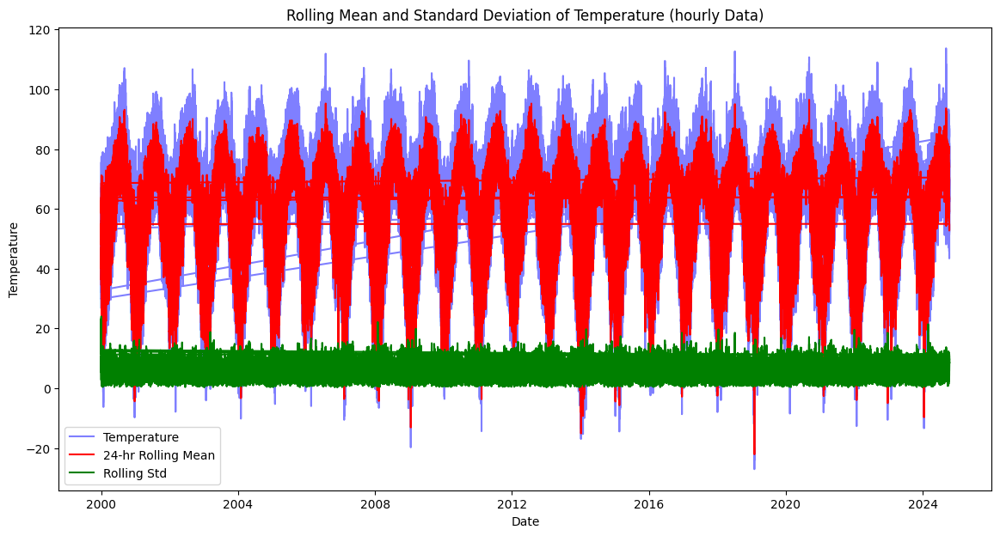

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


hourly_data = df.select_dtypes(include=[np.number])

# Step 2: Calculate the 30-day rolling mean
rolling_24_hr_mean = hourly_data['temp_2m'].rolling(window=24).mean()
rolling_24_hr_std = hourly_data['temp_2m'].rolling(window=24).std()

# Plotting the results
plt.figure(figsize=(14, 7))
plt.plot(hourly_data['temp_2m'], label='Temperature', color='blue', alpha=0.5)
plt.plot(rolling_24_hr_mean, label='24-hr Rolling Mean', color='red')
plt.plot(rolling_24_hr_std, label='Rolling Std', color='green')
plt.title('Rolling Mean and Standard Deviation of Temperature (hourly Data)')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.legend()
plt.show()


Plot shows how the std deviation and mean is constant over time. There is no increasing or descreasing trend . So this suggest. that our data is stationarity

#ADF Test (Augmented Dickey-Fuller)

In [49]:
from statsmodels.tsa.stattools import adfuller

hourly_data = df.select_dtypes(include=[np.number]).resample('D').mean()

result = adfuller(hourly_data['temp_2m'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])


ADF Statistic: -7.417348198648943
p-value: 6.879618124452261e-11


We ran an Augmented Dickey-Fuller (ADF) test on our time series data, and here’s what we found:

ADF Statistic: We got an ADF statistic of -7.42. This is quite a negative number, which indicates strong evidence against the null hypothesis that our data has a unit root (meaning it's non-stationary).

p-value: The p-value we obtained is 6.88e-11. Since this is much lower than the usual threshold of 0.05, we can confidently reject the null hypothesis.

What This Means
In simple terms, these results tell us that our time series data is stationary. This means it has a stable mean and variance over time, which is great news for the statistical models we plan to use

## Model Updates

We will be using 1D-CNN and LSTM to train our model. 1D CNN is especially designed for training 1D sequence data. This includes temporal tasks like audio analysis, time series forecasting or NLP where data is generally linear or sequential. 1D CNNs work by capturing the temporal patterns in the data and by extracting the meaningful features that contribute to the functioning of the task by analyzing the time or order present in the data. In our implementation, we will be making use of hourly data from 2000 to 2024, thus we chose 1D CNNs as one of our models.

LSTM (Long Short-Term Memory) is an improvised version of RNNs. The LSTM is different from the RNN because of the presence of a memory cell. The LSTM architecture consists of 3 gates: the input gate, output gate and forget gate. The input gate decides what information enters the memory cell, the forget gate decides what information can be forgotten and the output gate determines the output from the memory cell. This architecture is the basis for learning long-term dependencies in temporal data which is why we will be utilising this model.

We will also be exploring 1D-CNN + LSTM architecture. In this hybrid model, we will be obtaining the local features from the 1D-CNN model and the global features from the LSTM model.

Machine Learning Workflow:

1) Data Collection and Preprocessing:

    Transformation: Data cleaning(handling null values and outlier detection), Univariate and multivariate analysis, normalization

    Output: cleaned and preprocessed data

2) Feature Engineering:

    Transformation: Log transformation,Selection of important features and dropping highly correlated features by analysing the correlation matrix

    Output: features optimized for learning

3) Time Series Modeling:

    Stationarity Check: Use methods like the Augmented Dickey-Fuller (ADF) test to determine if the data is stationary. Non-stationary data may require differencing or transformation (e.g., seasonal decomposition) to achieve stationarity.

    Baseline Models: Implement ARIMA or SARIMA as baseline models to establish initial forecasting capabilities. These models can effectively capture trends and seasonal patterns in the data.

    ACF and PACF Analysis: Analyze the autocorrelation function (ACF) and partial autocorrelation function (PACF) plots to identify the appropriate parameters for ARIMA/SARIMA modeling.

    Output: Baseline model for comparison and foundational understanding of the data.

4) Model Training:

    Transformation: training the data on 1D-CNN, LSTM AND hybrid model, hyperparamter tuning

    Output: trained model for weather forecasting

5) Bias-Variance Tradeoff:

    Evaluation: Assess the model for overfitting and underfitting. High training accuracy but low validation accuracy indicates overfitting, while low accuracy on both indicates underfitting.

    Cross-Validation: Use techniques like k-fold cross-validation to evaluate model performance across different subsets of the data, helping to identify the best hyperparameters and ensure that the model generalizes well to unseen data.

    Output: Insights into model performance and refinement opportunities.


6) Prediction and evaluation:

    Transformation: we will be using MSE, MAE to predict the accuracy of our model

    Output: prediction on future weather values(temperature)

7) Refining the model:

    Transformation: re-adjusting hyperparameters and re-training the model to improve the prediction accruacy of our model

    Output: high-performing weather forecasting model





## Next Steps

We would be taking up the following steps to process our model:


1. ARIMA Model Baseline (by Nov. 5):

    Objective: Establish a baseline model for performance comparison.
    
    Tasks: 
    ARIMA Implementation: Use ACF and PACF plots to identify optimal ARIMA parameters, and train the ARIMA model.
    Evaluation: Calculate MSE and MAE as baseline metrics for ARIMA.

    Outcome: Baseline performance metrics for comparison with LSTM, CNN, and hybrid models.

2. Hyperparameter Tuning (by Nov. 10):

    Objective: Optimize model parameters for CNN and LSTM models.
    Tasks:
    CNN: Experiment with kernel size, filter count, and stride values.
    LSTM: Tune the number of LSTM layers, hidden units, dropout rates, and learning rates.
    Hybrid Model: Configure the 1D-CNN + LSTM model to combine local and global feature extraction effectively.

    Outcome: Optimal hyperparameter settings for each model, improving model accuracy.

3. Cross-Validation (by Nov. 14):

    Objective: Ensure model generalizability and prevent overfitting.

    Tasks:
    Use k-fold cross-validation to evaluate model performance on different subsets of the data.
    Record validation results across folds to identify the best-performing model configuration.

    Outcome: A reliable, validated model configuration that balances accuracy and generalization.

4. Model Training (by Nov. 20):

    Objective: Train the CNN, LSTM, and hybrid models with tuned parameters.

    Tasks:
    Train-Test Split: Divide data into training, validation, and test sets for model evaluation.
    Model Checkpoints: Save intermediate model states to prevent loss of progress.
    Overfitting/Underfitting Monitoring: Track training and validation losses to detect signs of overfitting or underfitting.

    Outcome: Trained models ready for evaluation.

5. Model Evaluation (by Nov. 24):

    Objective: Assess model performance with quantitative and qualitative metrics.

    Tasks:
    Metrics: Evaluate MSE, MAE, and RMSE for each model on the test set.
    Visual Comparison: Plot predicted vs. actual values to analyze model performance visually.
    Model Comparison: Compare ARIMA, CNN, LSTM, and hybrid models to determine the most accurate forecasting approach.

    Outcome: Detailed performance metrics and insights into each model's accuracy.

6. Fine-Tuning and Regularization (by Nov. 28):

    Objective: Refine the best-performing model to improve accuracy.

    Tasks:
    Apply regularization techniques (e.g., L2-regularization) to reduce overfitting.
    Experiment with adjustments based on evaluation feedback.
    Retrain and assess to see if changes yield improved prediction accuracy.

    Outcome: Refined model with reduced overfitting and enhanced performance.

7. Retraining and Final Testing (by Dec. 1):

    Objective: Retrain the selected model on the full dataset to maximize training data usage.

    Tasks:
    Retrain the final model on the combined training and validation sets.
    Perform a final test on the holdout test set to confirm performance.

    Outcome: A robust, fully trained model ready for deployment or operational use.

8. Documentation and Reporting (by Dec. 5):

    Objective: Prepare a comprehensive report and presentation summarizing the project.
    
    Tasks:
    Document all processes, including data preparation, model development, tuning, and evaluation.
    Include visualizations, final performance metrics, and model comparisons.
    Prepare a presentation to communicate methodology, results, and insights effectively.

    Outcome: Finalized report and presentation for stakeholders.
